# Data Import

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import pandas as pd

# Load the Airbnb listings dataset
airbnb_listings_path = './drive/MyDrive/Colab_Notebooks/Data_Management/Exam/AirBnbListings.csv'
airbnb_listings_df = pd.read_csv(airbnb_listings_path)

# Show general info about the dataset and datatype
airbnb_listings_df.info()

# Display the first few rows of the dataset for an overview
airbnb_listings_df.head()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12495 entries, 0 to 12494
Data columns (total 74 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            12495 non-null  int64  
 1   listing_url                                   12495 non-null  object 
 2   scrape_id                                     12495 non-null  int64  
 3   last_scraped                                  12495 non-null  object 
 4   name                                          12495 non-null  object 
 5   description                                   12156 non-null  object 
 6   neighborhood_overview                         6461 non-null   object 
 7   picture_url                                   12495 non-null  object 
 8   host_id                                       12495 non-null  int64  
 9   host_url                                      12495 non-null 

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,6983,https://www.airbnb.com/rooms/6983,20220624204326,2022-06-25,Copenhagen 'N Livin',Lovely apartment located in the hip Nørrebro a...,"Nice bars and cozy cafes just minutes away, ye...",https://a0.muscache.com/pictures/42044170/f63c...,16774,https://www.airbnb.com/users/show/16774,...,4.89,4.72,4.70,NaN,f,1,1,0,0,1.10
1,26057,https://www.airbnb.com/rooms/26057,20220624204326,2022-06-25,Lovely house - most attractive area,Our lovely house in the center of the city is ...,The neighborhood is the most famous one and th...,https://a0.muscache.com/pictures/miso/Hosting-...,109777,https://www.airbnb.com/users/show/109777,...,4.85,4.94,4.81,NaN,f,1,1,0,0,0.56
2,26473,https://www.airbnb.com/rooms/26473,20220624204326,2022-06-25,City Centre Townhouse Sleeps 1-10 persons,GUESTHOUSE ON KNABROSTRÆDE - located in the ab...,NaN,https://a0.muscache.com/pictures/8e132ba0-b68c...,112210,https://www.airbnb.com/users/show/112210,...,4.69,4.88,4.60,NaN,f,11,6,5,0,2.06
3,29118,https://www.airbnb.com/rooms/29118,20220624204326,2022-06-25,Best Location in Cool Istedgade,<b>The space</b><br />The apartment is situate...,NaN,https://a0.muscache.com/pictures/b83c7003-367a...,125230,https://www.airbnb.com/users/show/125230,...,5.00,4.85,4.77,NaN,f,1,1,0,0,0.15
4,670820,https://www.airbnb.com/rooms/670820,20220624204326,2022-06-25,1 Bedroom Apartment 5 min to Centre,The flat is located close to the city center -...,The flat is surrounded by parks and streets th...,https://a0.muscache.com/pictures/91442571/8563...,1566921,https://www.airbnb.com/users/show/1566921,...,4.88,4.88,4.25,NaN,f,1,1,0,0,0.10


The data set contains 74 columns in total

- id: Unique identifier for the listing (e.g., 6983, 26057).
- listing_url: URL of the listing on Airbnb (e.g., https://www.airbnb.com/rooms/6983).
- scrape_id: Identifier for the scrape this data was part of (e.g., 20220624204326).
- last_scraped: Date and time the listing was last scraped (e.g., 2022-06-25).
- name: Name of the listing (e.g., "Copenhagen 'N Livin'").
- description: Detailed description of the listing.
- neighborhood_overview: Host's description of the neighborhood.
- picture_url: URL to the Airbnb hosted image for the listing.
- host_id: Unique identifier for the host/user (e.g., 16774).
- host_url: The Airbnb page for the host.

... and many more

First we should do some preprocessing on the dataset.

#Preprocessing

Create a general descriptive statistics of the data to see if there is missing og invalid data in the dataset

In [3]:
# Generating descriptive statistics and missing data information for the dataset

# Descriptive statistics
descriptive_stats = airbnb_listings_df.describe(include='all')

# Missing data calculation
missing_data = airbnb_listings_df.isnull().mean() * 100

# Combining descriptive statistics with missing data percentage
descriptive_stats_with_missing = descriptive_stats.append(missing_data, ignore_index=True)
descriptive_stats_with_missing.index = ['count', 'mean', 'std', 'min', '25%', '50%', '75%', 'max', 'unique', 'top', 'freq', 'missing %']

descriptive_stats_with_missing.transpose()  # Transpose for better readability


<ipython-input-3-509603a57258>:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  descriptive_stats_with_missing = descriptive_stats.append(missing_data, ignore_index=True)


,count,mean,std,min,25%,50%,75%,max,unique,top,freq,missing %
id,12495.0,NaN,NaN,NaN,117854277392632576.0,242320097661882784.0,6983.0,17181867.5,36103558.0,52109224.5,655793181544663040.0,0.0
listing_url,12495,12495,https://www.airbnb.com/rooms/6983,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
scrape_id,12495.0,NaN,NaN,NaN,20220624204326.0,0.0,20220624204326.0,20220624204326.0,20220624204326.0,20220624204326.0,20220624204326.0,0.0
last_scraped,12495,2,2022-06-25,9403,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
name,12495,12002,Cozy apartment in the heart of Copenhagen,18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
calculated_host_listings_count,12495.0,NaN,NaN,NaN,5.001281,23.135963,1.0,1.0,1.0,1.0,181.0,0.0
calculated_host_listings_count_entire_homes,12495.0,NaN,NaN,NaN,4.746699,23.157535,0.0,1.0,1.0,1.0,181.0,0.0
calculated_host_listings_count_private_rooms,12495.0,NaN,NaN,NaN,0.235534,0.989614,0.0,0.0,0.0,0.0,18.0,0.0
calculated_host_listings_count_shared_rooms,12495.0,NaN,NaN,NaN,0.004082,0.083347,0.0,0.0,0.0,0.0,3.0,0.0


To better have an overview of each column, we create a function that loops though each column and prints the descriptive statistics.

In [4]:
def column_analysis(dataframe, column_name):
    stats = dataframe[column_name].describe(include='all')
    missing_percentage = dataframe[column_name].isnull().mean() * 100
    return {
        'Descriptive Statistics': stats,
        'Missing Data Percentage': missing_percentage
    }

# Loop through each column and print the report
for column in airbnb_listings_df.columns:
    analysis = column_analysis(airbnb_listings_df, column)
    print(f"--- Analysis of Column: {column} ---")
    print(analysis['Descriptive Statistics'])
    print(f"Missing Data Percentage: {analysis['Missing Data Percentage']:.2f}%\n")

--- Analysis of Column: id ---
count    1.249500e+04
mean     1.178543e+17
std      2.423201e+17
min      6.983000e+03
25%      1.718187e+07
50%      3.610356e+07
75%      5.210922e+07
max      6.557932e+17
Name: id, dtype: float64
Missing Data Percentage: 0.00%

--- Analysis of Column: listing_url ---
count                                 12495
unique                                12495
top       https://www.airbnb.com/rooms/6983
freq                                      1
Name: listing_url, dtype: object
Missing Data Percentage: 0.00%

--- Analysis of Column: scrape_id ---
count    1.249500e+04
mean     2.022062e+13
std      0.000000e+00
min      2.022062e+13
25%      2.022062e+13
50%      2.022062e+13
75%      2.022062e+13
max      2.022062e+13
Name: scrape_id, dtype: float64
Missing Data Percentage: 0.00%

--- Analysis of Column: last_scraped ---
count          12495
unique             2
top       2022-06-25
freq            9403
Name: last_scraped, dtype: object
Missing Data Perce

We can see that there are a couple of columns which have 100% missing data. We should remove these columns since they have no relevance for our project

In [5]:
# Calculate the percentage of missing data for each column
missing_data_percentage = airbnb_listings_df.isnull().mean()

# Identifying columns with 100% missing data
columns_to_drop = missing_data_percentage[missing_data_percentage == 1].index
print(f"--- 100% missing data columns to drop: {columns_to_drop} ---")

# Dropping these columns
airbnb_listings_df_cleaned = airbnb_listings_df.drop(columns=columns_to_drop)

# The cleaned DataFrame 'airbnb_listings_df_cleaned' now has the columns with 100% missing data removed.
# Print shape to confirm that coloumns are droped from the initial 74 columns
airbnb_listings_df_cleaned.shape


--- 100% missing data columns to drop: Index(['neighbourhood_group_cleansed', 'bathrooms', 'calendar_updated',
       'license'],
      dtype='object') ---


(12495, 70)

In [6]:
# Droping scrape_id, calendar_last_scraped, host_total_listings_count since we don't need that
airbnb_listings_df_cleaned = airbnb_listings_df_cleaned.drop(columns= ['scrape_id', 'calendar_last_scraped', 'host_total_listings_count'])

airbnb_listings_df_cleaned.shape

(12495, 67)

Let's also remove all columns with pictures and/or url’s since they have no relevance for our analysis purposes

In [7]:
# List of potential keywords in column names for pictures or URLs
keywords = ['url', 'picture', 'image']

# Find columns that contain any of the keywords
columns_to_drop = [col for col in airbnb_listings_df_cleaned.columns if any(keyword in col.lower() for keyword in keywords)]
print(f"--- Columns to drop: {columns_to_drop} ---")

# Drop these columns
airbnb_listings_df_cleaned = airbnb_listings_df_cleaned.drop(columns=columns_to_drop)
airbnb_listings_df_cleaned.shape

--- Columns to drop: ['listing_url', 'picture_url', 'host_url', 'host_thumbnail_url', 'host_picture_url'] ---


(12495, 62)

To perserve data intregrity we should check to see if our listing id's are unique

In [8]:
# Check if all IDs are unique
are_ids_unique = airbnb_listings_df_cleaned['id'].nunique() == airbnb_listings_df_cleaned['id'].count()

print("Are all IDs unique?", are_ids_unique)

Are all IDs unique? True


Next we should look at some outliers and determine if we want to keep them.

We can see that we are missing 0.01% of host_name - which we would consider essential data in a rental. Let's look at it

In [9]:
airbnb_listings_df_cleaned[airbnb_listings_df_cleaned['host_name'].isnull()]

,id,last_scraped,name,description,neighborhood_overview,host_id,host_name,host_since,host_location,host_about,...,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
2551,13576965,2022-06-25,Super place next to everything,Nice place you will enjoy it,NaN,76645464,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,f,1,1,0,0,0.01


It looks like a fake or not relevant listing with no reviews. Lets drop it.

In [10]:
airbnb_listings_df_cleaned = airbnb_listings_df_cleaned.dropna(subset=['host_name'])
airbnb_listings_df_cleaned.shape

(12494, 62)

All ID's are unique which is great.


Next we should look into the data type and check if we need to do a Data type conversion.
In the data description above we can see that there are coloumns which are not the right data type (ex. last_scraped not being datetime). We will convert that now.

In [11]:
airbnb_listings_df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12494 entries, 0 to 12494
Data columns (total 62 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            12494 non-null  int64  
 1   last_scraped                                  12494 non-null  object 
 2   name                                          12494 non-null  object 
 3   description                                   12155 non-null  object 
 4   neighborhood_overview                         6461 non-null   object 
 5   host_id                                       12494 non-null  int64  
 6   host_name                                     12494 non-null  object 
 7   host_since                                    12494 non-null  object 
 8   host_location                                 12472 non-null  object 
 9   host_about                                    6400 non-null  

In [12]:
# Boolean conversions
boolean_columns = ['host_is_superhost', 'host_has_profile_pic',
                   'host_identity_verified', 'has_availability', 'instant_bookable']
for col in boolean_columns:
    airbnb_listings_df_cleaned[col] = airbnb_listings_df_cleaned[col].map({'t': True, 'f': False})

# Datetime conversions
date_columns = ['last_scraped', 'host_since', 'first_review', 'last_review']
for col in date_columns:
    airbnb_listings_df_cleaned[col] =  pd.to_datetime(airbnb_listings_df_cleaned[col]).dt.date

# Numeric conversions
numeric_columns = ['host_listings_count',
                   'accommodates', 'bedrooms', 'beds',
                   'minimum_nights', 'maximum_nights']
for col in numeric_columns:
    airbnb_listings_df_cleaned[col] = pd.to_numeric(airbnb_listings_df_cleaned[col])

# Currency conversion (assuming the 'price' column is in the format '$123.45')
airbnb_listings_df_cleaned['price'] = airbnb_listings_df_cleaned['price'].replace('[\$,]', '', regex=True).astype(float)

# Categorical to numeric codes (for 'room_type', 'property_type')
#airbnb_listings_df_cleaned['room_type'] = airbnb_listings_df_cleaned['room_type'].astype('category').cat.codes
#airbnb_listings_df_cleaned['property_type'] = airbnb_listings_df_cleaned['property_type'].astype('category').cat.codes

# Check the data types
airbnb_listings_df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12494 entries, 0 to 12494
Data columns (total 62 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            12494 non-null  int64  
 1   last_scraped                                  12494 non-null  object 
 2   name                                          12494 non-null  object 
 3   description                                   12155 non-null  object 
 4   neighborhood_overview                         6461 non-null   object 
 5   host_id                                       12494 non-null  int64  
 6   host_name                                     12494 non-null  object 
 7   host_since                                    12494 non-null  object 
 8   host_location                                 12472 non-null  object 
 9   host_about                                    6400 non-null  

In [13]:
airbnb_listings_df_cleaned

,id,last_scraped,name,description,neighborhood_overview,host_id,host_name,host_since,host_location,host_about,...,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,6983,2022-06-25,Copenhagen 'N Livin',Lovely apartment located in the hip Nørrebro a...,"Nice bars and cozy cafes just minutes away, ye...",16774,Simon,2009-05-12,"København, Denmark",I'm currently working as an environmental cons...,...,4.86,4.89,4.72,4.70,False,1,1,0,0,1.10
1,26057,2022-06-25,Lovely house - most attractive area,Our lovely house in the center of the city is ...,The neighborhood is the most famous one and th...,109777,Kari,2010-04-17,"København, Denmark","We are a family with 2 children, and living in...",...,4.92,4.85,4.94,4.81,False,1,1,0,0,0.56
2,26473,2022-06-25,City Centre Townhouse Sleeps 1-10 persons,GUESTHOUSE ON KNABROSTRÆDE - located in the ab...,NaN,112210,Julia,2010-04-22,"Copenhagen, Denmark","Active young woman, started as an expat in Cop...",...,4.77,4.69,4.88,4.60,False,11,6,5,0,2.06
3,29118,2022-06-25,Best Location in Cool Istedgade,<b>The space</b><br />The apartment is situate...,NaN,125230,Nana,2010-05-15,"Copenhagen, Denmark",I have a Master of Arts in Musicology and I wo...,...,5.00,5.00,4.85,4.77,False,1,1,0,0,0.15
4,670820,2022-06-25,1 Bedroom Apartment 5 min to Centre,The flat is located close to the city center -...,The flat is surrounded by parks and streets th...,1566921,Mihaela,2012-01-04,"Copenhagen, Capital Region of Denmark, Denmark",I truly enjoy interacting with people from dif...,...,4.75,4.88,4.88,4.25,False,1,1,0,0,0.10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12490,35292340,2022-06-24,Familievenlig lejlighed nær københavn,Lys 4 værelses lejlighed på 89km2. <br />3 so...,"Dyrehavsbakken, hareskoven og Københavns centr...",265718685,Rasmus,2019-06-02,"Søborg, Denmark","Familie med mor og far på 40år, 2 børn på 11 o...",...,4.90,4.90,4.50,4.70,False,1,1,0,0,0.27
12491,591033498117946366,2022-06-24,Bright house 25 min to Copenhagen central,My girlfriend and i are renting out our house ...,5 minute walk from the house there is a park l...,88185300,Rasmus Dreier,2016-08-05,"Copenhagen, Capital Region of Denmark, Denmark","I am a software developer, living and working ...",...,NaN,NaN,NaN,NaN,False,1,1,0,0,NaN
12492,9872599,2022-06-24,"Super Juli discount: Nice house, central and calm","Classic 3-storey villa with stucco ceilings, o...","Attractive, cozy and peaceful child-friendly r...",31894497,Jacob Søby,2015-04-25,"Copenhagen, Denmark",Vi er vandt til som gæster at leje huse og lej...,...,5.00,4.92,4.92,4.92,False,1,1,0,0,0.20
12493,595224605480025818,2022-06-24,"Villa, 1936 with private garden near Copenhagen",Villa near Copenhagen 15 minute transport from...,NaN,452197516,Carlo,2022-04-01,DK,NaN,...,NaN,NaN,NaN,NaN,True,1,1,0,0,NaN


## Descriptive Statistics

Before We begin our exploration we first want to compute basic descriptive statistics for numerical and categorical variables.

These statistics provide and initial understanding of the distribution and typical values within our dataset.

In [14]:
# Correctly selecting multiple columns using a list
categorical_columns = ['host_is_superhost', 'host_has_profile_pic',
                       'host_identity_verified', 'has_availability',
                       'instant_bookable']

# Calculating frequency counts for categorical columns and percentage of missing values
categorical_stats = airbnb_listings_df_cleaned[categorical_columns].apply(pd.Series.value_counts)
missing_percentage = airbnb_listings_df_cleaned[categorical_columns].isnull().mean() * 100

# Combining both statistics
combined_categorical_stats = categorical_stats.T
combined_categorical_stats['% Missing'] = missing_percentage

combined_categorical_stats


,False,True,% Missing
host_is_superhost,11581,913,0.0
host_has_profile_pic,187,12307,0.0
host_identity_verified,2027,10467,0.0
has_availability,70,12424,0.0
instant_bookable,9737,2757,0.0


In [15]:
# Loop through all columns and perform analysis, skipping the categorical columns
for column in airbnb_listings_df_cleaned.columns:
    if column not in categorical_columns:
        analysis = column_analysis(airbnb_listings_df_cleaned, column)
        print(f"--- Analysis of Column: {column} ---")
        print(analysis['Descriptive Statistics'])
        print(f"Missing Data Percentage: {analysis['Missing Data Percentage']:.2f}%\n")

--- Analysis of Column: id ---
count    1.249400e+04
mean     1.178637e+17
std      2.423275e+17
min      6.983000e+03
25%      1.719077e+07
50%      3.610467e+07
75%      5.210947e+07
max      6.557932e+17
Name: id, dtype: float64
Missing Data Percentage: 0.00%

--- Analysis of Column: last_scraped ---
count          12494
unique             2
top       2022-06-25
freq            9402
Name: last_scraped, dtype: object
Missing Data Percentage: 0.00%

--- Analysis of Column: name ---
count                                         12494
unique                                        12001
top       Cozy apartment in the heart of Copenhagen
freq                                             18
Name: name, dtype: object
Missing Data Percentage: 0.00%

--- Analysis of Column: description ---
count                                                 12155
unique                                                11943
top       Nyd det simple liv i denne fredelige og centra...
freq                      

Since price is often a very important metric for doing analysis like these, we should definitly check to see if there are any outlieres that need filtering.

We can see from the above statistics, that the price column containts a max price of 86,647 and a min price of 0. These indicate that there are outliers which need to be removed.

Let's start by looking at the top 5% most expensive and compare them to the mean price of listings.

In [16]:
# Calculate the 98th percentile of the 'price' column
percentile_98 = airbnb_listings_df_cleaned['price'].quantile(0.98)

# Filter the listings that are above the 98th percentile
top_2_percent_listings = airbnb_listings_df_cleaned[airbnb_listings_df_cleaned['price'] > percentile_98]

# Sort these listings by price in descending order to get the most expensive ones
top_2_percent_listings = top_2_percent_listings.sort_values(by='price', ascending=False)

# Displaying the prices of the top 2 most expensive listings
top_2_most_expensive_prices = top_2_percent_listings[['id', 'name', 'price']].head(10)
top_2_most_expensive_prices

,id,name,price
2302,13062703,Huge room in brand new apartment,86647.0
2146,11339117,“My Oasis”... a Cosy room in the Harte off Cph.,64900.0
6306,37962821,Luxury Apartment In The Heart Of Copenhagen - ...,63240.0
887,3282258,Copenhagen 91 m2,63114.0
5320,33108071,not available for bookings due to sale,62000.0
4066,24198301,Charming apartment in center of copenhagen,60000.0
2952,16397010,Cosy and spacey apartment!,58000.0
7396,44224836,Cozy and bright 2-room apartment with big balcony,44000.0
6808,41764565,.,36200.0
2103,11230367,Five star interior design house.,20000.0


As we can see, there are a couple of extreme outliers which we will need to remove before continueing. We should also remove all listings that have a price set to 0, since these too are outliers.

In [17]:
# Filter out the top 2% most expensive listings and listings with 0 price
airbnb_listings_df_cleaned = airbnb_listings_df_cleaned[(airbnb_listings_df_cleaned['price'] <= percentile_98) & (airbnb_listings_df_cleaned['price'] > 0)]

Let's check that the top 2% have been filtered away

In [18]:
# Calculate the 98th percentile of the 'price' column
percentile_98 = airbnb_listings_df_cleaned['price'].quantile(0.98)

# Filter the listings that are above the 98th percentile
top_2_percent_listings = airbnb_listings_df_cleaned[airbnb_listings_df_cleaned['price'] > percentile_98]

# Sort these listings by price in descending order to get the most expensive ones
top_2_percent_listings = top_2_percent_listings.sort_values(by='price', ascending=False)

# Displaying the prices of the top 2 most expensive listings
top_2_most_expensive_prices = top_2_percent_listings[['id', 'name', 'price']].head(10)
top_2_most_expensive_prices

,id,name,price
6537,39583827,Vidunderligt byhus med to store tagterrasser p...,3500.0
8786,51504789,Luxury 4 bedrooms & 2 bathrooms flat in old town,3500.0
3233,18512442,Historic Frederiksberg Home with spectacular view,3500.0
3334,19117174,Cozy Beach House,3500.0
3649,21017011,Magnificent Palace Apartment in Cph Centre,3500.0
4438,25927962,Beautiful old villa close to metro and central...,3500.0
1565,7086008,Central apartment overlooking the lakes,3500.0
4684,27428111,Exclusive family friendly designer home,3500.0
2301,13062061,Chic and Soothing Apartment in the Vibrant Cit...,3500.0
7046,42353970,Delux Studio 50m2 - View,3500.0


Looks a lot more resonable. We should now check the final shape of our dataframe and print new descriptive analytics for the price column.

In [19]:
analysis = column_analysis(airbnb_listings_df_cleaned, 'price')

# Print the analysis results for the 'price' column
print("--- Analysis of Column: price ---")
print(analysis['Descriptive Statistics'])
print(f"Missing Data Percentage: {analysis['Missing Data Percentage']:.2f}%\n")

--- Analysis of Column: price ---
count    12244.000000
mean      1076.965943
std        567.676033
min         96.000000
25%        700.000000
50%        950.000000
75%       1300.000000
max       3500.000000
Name: price, dtype: float64
Missing Data Percentage: 0.00%



Much better. Now we don't have outliers in the top or buttom of our price range, making the dataframe much more accurate.

In [20]:
airbnb_listings_df_cleaned.shape

(12244, 62)

This leaves us with 12,244 listings as our final dataframe.

Let's export this to a csv file

In [ ]:
airbnb_listings_df_cleaned.to_csv('./drive/MyDrive/Colab_Notebooks/Data_Management/Exam/noIndex_noConversion_cleaned_AirBnbListings.csv', index=False)

# Exploratory analysis of the data

Setting our dataframe to be our new cleaned dataframe.

In [21]:
airbnb_listings_df = airbnb_listings_df_cleaned

## Looking at Geographical Distribution of the AirBnB listings

In [22]:
# Installing contextily for our maps

!pip install contextily

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.6/20.6 MB 55.9 MB/s eta 0:00:00


In [23]:
# To analyze geographical distribution, we need to check if there are relevant geographical columns like latitude and longitude
geographical_columns = airbnb_listings_df.filter(like='lat').columns.tolist() + airbnb_listings_df.filter(like='long').columns.tolist()
geographical_columns


['latitude',
 'calculated_host_listings_count',
 'calculated_host_listings_count_entire_homes',
 'calculated_host_listings_count_private_rooms',
 'calculated_host_listings_count_shared_rooms',
 'longitude']

The dataset includes two key geographical columns: 'latitude' and 'longitude', which can be used to analyze the geographical distribution of Airbnb listings.

Let's start by creating a visualization to see where the listings are concentrated based on these coordinates. This will help in understanding the spatial distribution of Airbnb properties in the area covered by the dataset. We'll proceed with generating a plot that shows the distribution of listings on a map.

We should first confirm that the data is indeed showing the right coordinates of the greater Copenhagen area:

In [25]:
# Checking the range of latitude and longitude to confirm if they are within Copenhagen's geographical area
copenhagen_lat_range = (55.615, 55.727)  # Approximate latitude range for Copenhagen
copenhagen_long_range = (12.453, 12.65)  # Approximate longitude range for Copenhagen

# Filtering the dataset for listings within the latitude and longitude range of Copenhagen
copenhagen_listings = airbnb_listings_df[
    (airbnb_listings_df['latitude'].between(*copenhagen_lat_range)) &
    (airbnb_listings_df['longitude'].between(*copenhagen_long_range))
]

# Checking how many listings are within Copenhagen's coordinates
number_of_listings_in_copenhagen = copenhagen_listings.shape[0]
total_number_of_listings = airbnb_listings_df.shape[0]
percentage_in_copenhagen = (number_of_listings_in_copenhagen / total_number_of_listings) * 100

number_of_listings_in_copenhagen, percentage_in_copenhagen


(11978, 97.82750735053905)

The analysis shows that 11,987 out of the total 12,244 listings in the dataset, which is approximately 97.83%, are located within the geographical boundaries of Copenhagen. This high percentage indicates that the dataset is predominantly focused on Copenhagen.

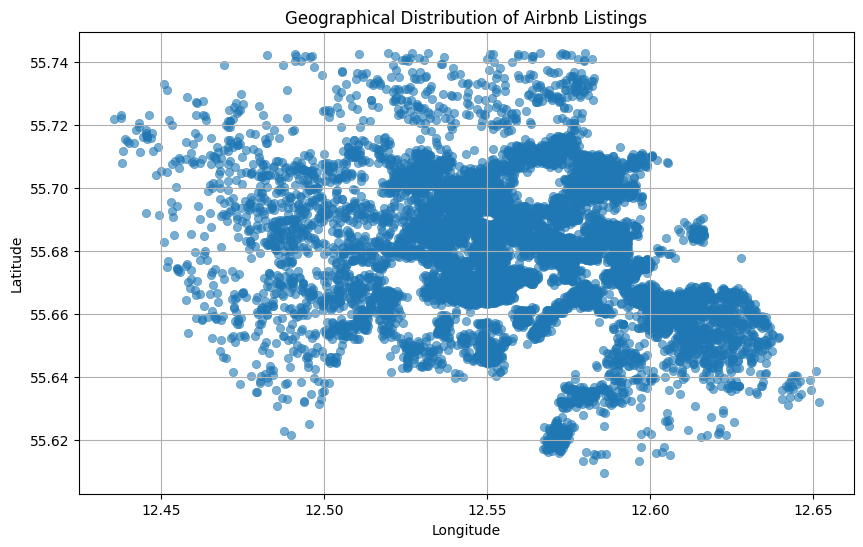

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Setting up the figure
plt.figure(figsize=(10, 6))

# Plotting the geographical distribution of listings
sns.scatterplot(x='longitude', y='latitude', data=airbnb_listings_df, alpha=0.6, edgecolor=None)

plt.title('Geographical Distribution of Airbnb Listings')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)
plt.show()


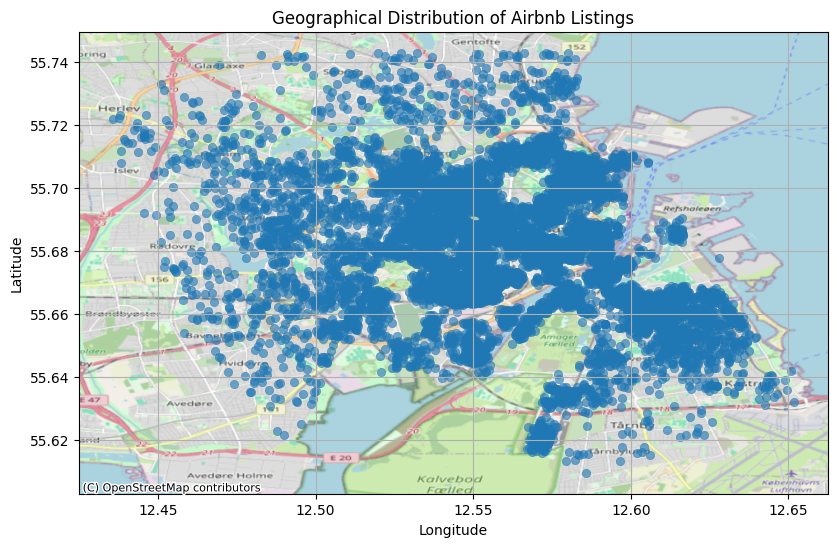

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import contextily as ctx
import geopandas as gpd
from shapely.geometry import Point

# Convert your DataFrame to a GeoDataFrame
gdf = gpd.GeoDataFrame(airbnb_listings_df, geometry=gpd.points_from_xy(airbnb_listings_df.longitude, airbnb_listings_df.latitude))
gdf.crs = "EPSG:4326"  # Set the coordinate reference system to WGS84 (latitude/longitude)

# Setting up the figure
fig, ax = plt.subplots(figsize=(10, 6))

# Plotting the geographical distribution of listings
sns.scatterplot(x='longitude', y='latitude', data=airbnb_listings_df, alpha=0.6, edgecolor=None, ax=ax)

# Adding the map background
ctx.add_basemap(ax, crs=gdf.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

ax.set_title('Geographical Distribution of Airbnb Listings')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.grid(True)
plt.show()


Looking at the distribution, it's clear that there are high areas of concentrations - however, from looking at the visualization as it is now, we can't see in what neighborhoods there are the highests concentation of listings. Let's add a proper map overlay to the visualization.

<ipython-input-203-d96f3a87adad>:5: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


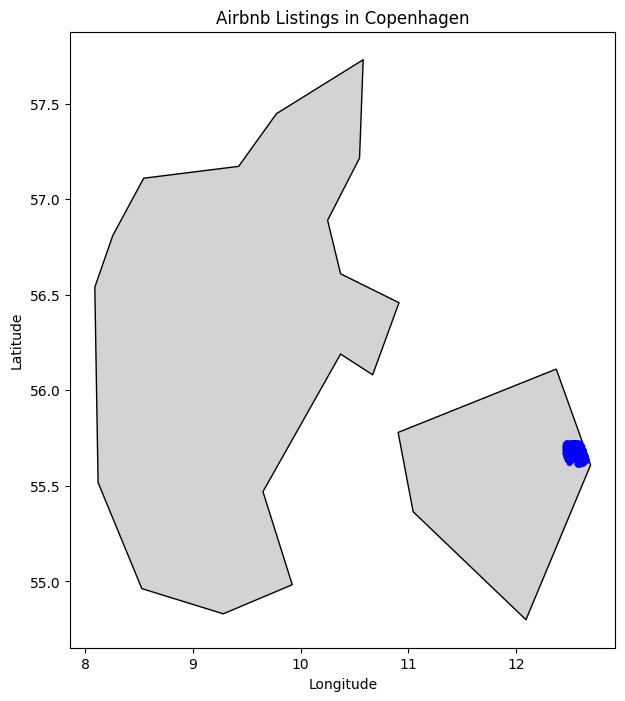

In [ ]:
import geopandas as gpd
from shapely.geometry import Point

# Loading a map of Copenhagen using GeoPandas
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
copenhagen_map = world[world.name == "Denmark"].set_crs(epsg=4326)

# Creating a GeoDataFrame for the Airbnb listings in Copenhagen
geometry = [Point(xy) for xy in zip(copenhagen_listings.longitude, copenhagen_listings.latitude)]
geo_copenhagen_listings = gpd.GeoDataFrame(copenhagen_listings, crs="EPSG:4326", geometry=geometry)

# Plotting the map with listings
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
copenhagen_map.plot(ax=ax, color='lightgrey', edgecolor='black')
geo_copenhagen_listings.plot(ax=ax, markersize=10, color='blue', alpha=0.6)

plt.title('Airbnb Listings in Copenhagen')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


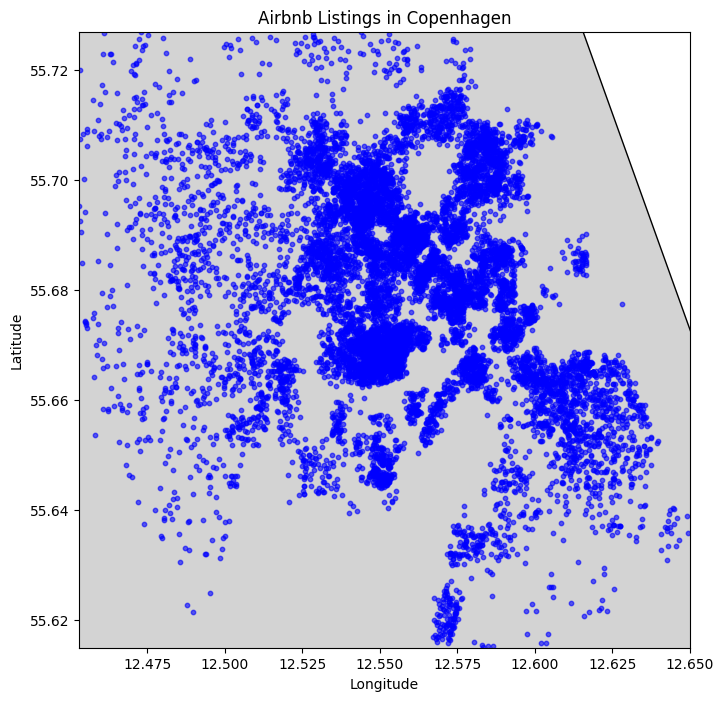

In [ ]:
# To focus only on Copenhagen, we need to adjust the geographical extent (bounding box) of the plot.
# Setting the bounds to a smaller area focused on Copenhagen

# Defining the bounding box for Copenhagen
copenhagen_bounds = {
    "min_lon": copenhagen_long_range[0],
    "max_lon": copenhagen_long_range[1],
    "min_lat": copenhagen_lat_range[0],
    "max_lat": copenhagen_lat_range[1]
}

# Plotting the map with the new bounds
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
copenhagen_map.to_crs(epsg=4326).plot(ax=ax, color='lightgrey', edgecolor='black')
geo_copenhagen_listings.plot(ax=ax, markersize=10, color='blue', alpha=0.6)

# Setting the bounds to focus on Copenhagen
ax.set_xlim(copenhagen_bounds["min_lon"], copenhagen_bounds["max_lon"])
ax.set_ylim(copenhagen_bounds["min_lat"], copenhagen_bounds["max_lat"])

plt.title('Airbnb Listings in Copenhagen')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


Let's look at the top 1000 listings as a start.

/usr/local/lib/python3.10/dist-packages/contextily/tile.py:614: UserWarning: The inferred zoom level of 29 is not valid for the current tile provider (valid zooms: 0 - 19).
  warnings.warn(msg)


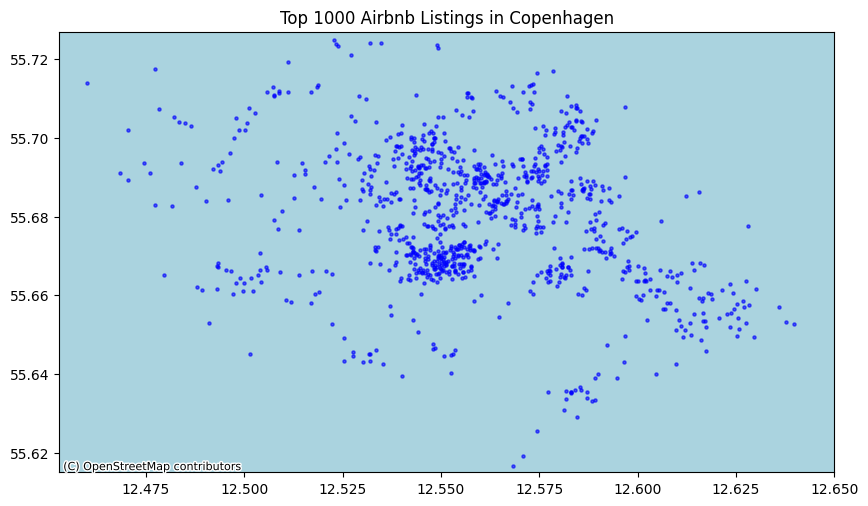

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from shapely.geometry import Point

# Select the top 1000 listings
top_1000_listings = copenhagen_listings.head(1000)

# Create a GeoDataFrame
geometry = [Point(xy) for xy in zip(top_1000_listings['longitude'], top_1000_listings['latitude'])]
gdf = gpd.GeoDataFrame(top_1000_listings, geometry=geometry, crs="EPSG:4326")

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))
gdf.plot(ax=ax, markersize=5, color='blue', alpha=0.6)

# Add a basemap (contextily uses Web Mercator (EPSG:3857), so we need to convert the CRS)
gdf.to_crs(epsg=3857, inplace=True)
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

# Adjusting the axis limits to the bounds of Copenhagen
ax.set_xlim(copenhagen_bounds["min_lon"], copenhagen_bounds["max_lon"])
ax.set_ylim(copenhagen_bounds["min_lat"], copenhagen_bounds["max_lat"])

plt.title('Top 1000 Airbnb Listings in Copenhagen')
plt.show()


Instead of having a static map, we can instead use folium as an interactive map which has inbuildt powerful tools to group the data. Let's start with the top_1000_listings first

In [ ]:
import folium

# Create a map centered around Copenhagen
map_copenhagen = folium.Map(location=[55.6761, 12.5683], zoom_start=12)

# Add the top 1000 Airbnb listings to the map
for idx, row in top_1000_listings.iterrows():
    folium.Marker([row['latitude'], row['longitude']], popup=row['name']).add_to(map_copenhagen)

# Display the map
map_copenhagen


Although this map is interactive, it's still too crowded to gather any meaningful oversight over the data.

Also, we are just looking at the top_1000_listings which limit our data significantly. Let's group the listings with the inbuildt cluster tool from folium. This will group the datapoints dynamically together as you zoom in or out from the map.

In [ ]:
from folium.plugins import MarkerCluster

# Create a map centered around Copenhagen
map_copenhagen = folium.Map(location=[55.6761, 12.5683], zoom_start=12)

# Create a marker cluster
marker_cluster = MarkerCluster().add_to(map_copenhagen)

# Add listings to the cluster
for idx, row in copenhagen_listings.iterrows():
    folium.Marker([row['latitude'], row['longitude']], popup=row['name']).add_to(marker_cluster)

# Display the map
map_copenhagen


Now that we've grouped the datapoints we should start to expand our analysis to create meaningful insights into the data. We can start with doing a price analysis of the datapoint to better understand how the prices vary on location of the listings.

## Price analysis

<ipython-input-207-9120cc05ccfe>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copenhagen_listings['price'] = copenhagen_listings['price'].replace('[\$,]', '', regex=True).astype(float)


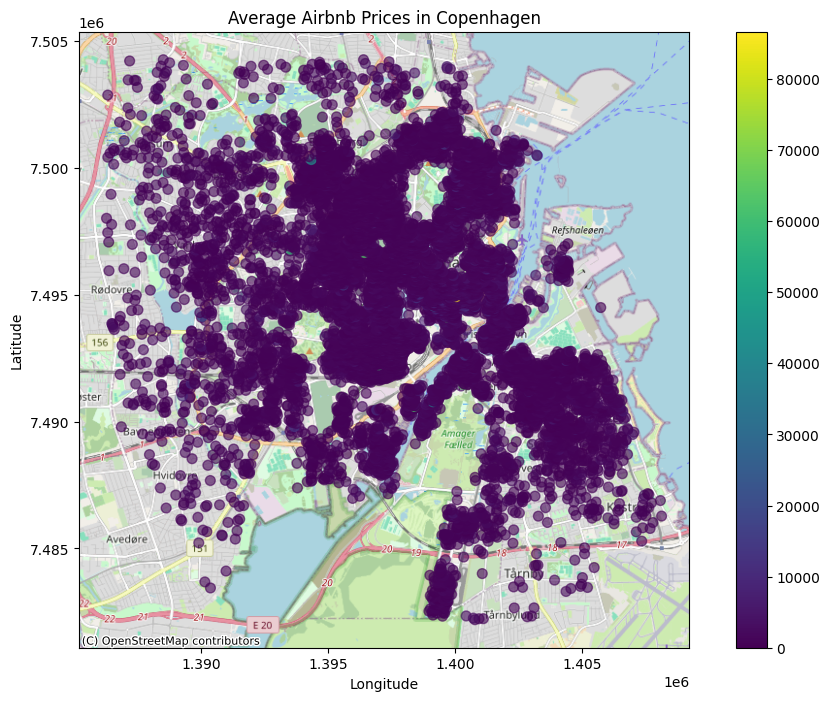

In [ ]:
# Price Analysis: Understanding how prices vary across different areas of Copenhagen

# Converting price to a numeric value if it's not already
copenhagen_listings['price'] = copenhagen_listings['price'].replace('[\$,]', '', regex=True).astype(float)

# Aggregate data: Calculate average price for each latitude and longitude
# Grouping by latitude and longitude for a more granular analysis
average_prices = copenhagen_listings.groupby(['latitude', 'longitude'])['price'].mean().reset_index()

# Creating a GeoDataFrame for the average prices
geometry = [Point(xy) for xy in zip(average_prices['longitude'], average_prices['latitude'])]
geo_average_prices = gpd.GeoDataFrame(average_prices, geometry=geometry, crs="EPSG:4326")

# Convert CRS to Web Mercator
geo_average_prices = geo_average_prices.to_crs(epsg=3857)

# Plotting the average prices on a map
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
geo_average_prices.plot(ax=ax, column='price', cmap='viridis', legend=True, markersize=50, alpha=0.6)

# Add a basemap with a manually set zoom level
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, zoom=12)

plt.title('Average Airbnb Prices in Copenhagen')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


Ok - It seems we have outliers that skew the data, making the visualization difficult to follow. Let's fix that

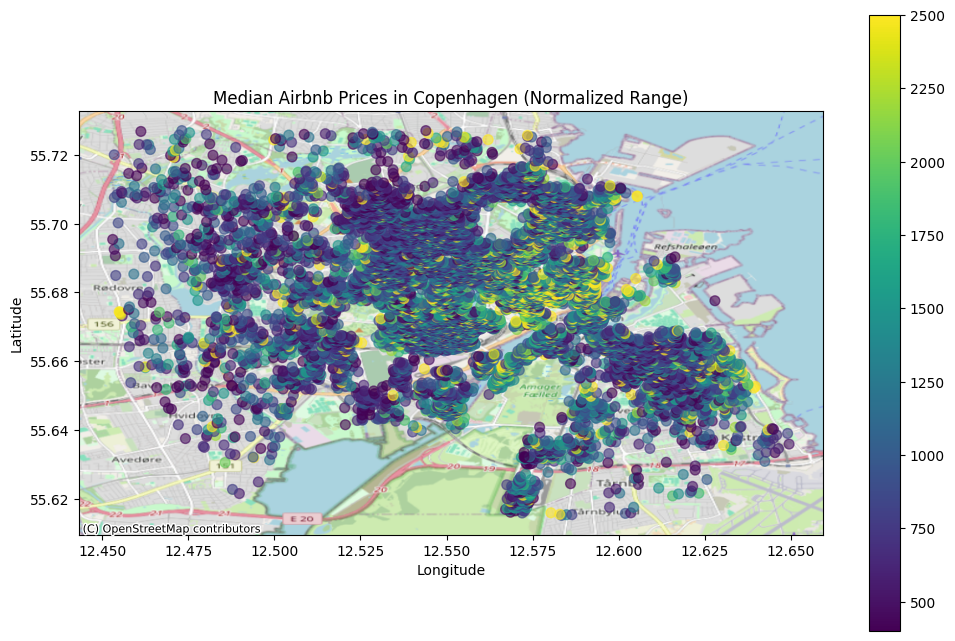

In [ ]:
# Averaging out prices to handle outliers
# One common approach is to use the median price instead of the mean, as it's less sensitive to extreme values

# Calculate median prices
median_prices = copenhagen_listings.groupby(['latitude', 'longitude'])['price'].median().reset_index()

# Creating a GeoDataFrame for the median prices
geometry_median = [Point(xy) for xy in zip(median_prices['longitude'], median_prices['latitude'])]
geo_median_prices = gpd.GeoDataFrame(median_prices, geometry=geometry_median, crs="EPSG:4326")

# Defining a specific range for the color scale to control the visualization of prices
# We can set a minimum and maximum value for the color scale to normalize the range
# We can start with looking at everything between 5 and 95 percentile data

# Determine the range for the color scale
min_price = geo_median_prices['price'].quantile(0.05)  # 5th percentile
max_price = geo_median_prices['price'].quantile(0.95)  # 95th percentile

# Plotting with the defined color range
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
geo_median_prices.plot(ax=ax, column='price', cmap='viridis', legend=True, markersize=50, alpha=0.6,
                       vmin=min_price, vmax=max_price)

ctx.add_basemap(ax, crs=geo_median_prices.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

plt.title('Median Airbnb Prices in Copenhagen (Normalized Range)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


From looking at the map we can see that there is a higher concentation of high-price AirBnb's available near the center of copenhagen and near the costal regions - which is to be expected.

Perhaps these listings contain certain attributes that influence this price. We will continue to look at the property types.

In [ ]:
# Examining the available property and room types in the dataset

# Checking the unique values for property type and room type
property_types = copenhagen_listings['property_type'].unique()
room_types = copenhagen_listings['room_type'].unique()

property_types, room_types


(array(['Entire rental unit', 'Entire home', 'Entire townhouse',
        'Entire condo', 'Private room in home', 'Private room in condo',
        'Private room in rental unit', 'Entire villa',
        'Private room in loft', 'Entire loft',
        'Shared room in rental unit', 'Entire bungalow', 'Houseboat',
        'Private room in townhouse', 'Private room in guest suite',
        'Entire serviced apartment', 'Boat', 'Entire guesthouse',
        'Private room in villa', 'Room in hostel',
        'Private room in bed and breakfast', 'Barn',
        'Shared room in cabin', 'Entire cabin', 'Shared room in loft',
        'Tiny home', 'Private room in serviced apartment',
        'Entire cottage', 'Private room in bungalow',
        'Private room in hut', 'Private room in guesthouse',
        'Private room', 'Entire guest suite', 'Room in boutique hotel',
        'Room in serviced apartment', 'Shared room in bungalow',
        'Private room in tiny home', 'Entire vacation home',
        '

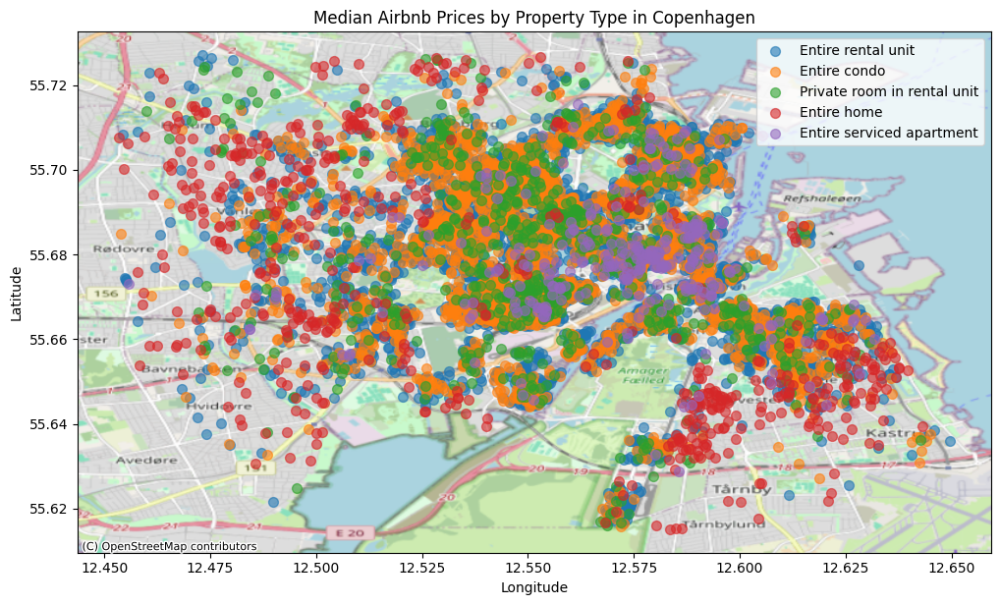

In [ ]:
# Property Type Analysis: Focus on the most common property types for clarity

# Selecting the top 5 most common property types for analysis
top_property_types = copenhagen_listings['property_type'].value_counts().head(5).index

# Filtering the dataset for these top property types
filtered_listings = copenhagen_listings[copenhagen_listings['property_type'].isin(top_property_types)]

# Group by property type and geographical location, then calculate the median price
median_prices_by_property_type = filtered_listings.groupby(['property_type', 'latitude', 'longitude'])['price'].median().reset_index()

# Creating a GeoDataFrame for the median prices by property type
geometry_property = [Point(xy) for xy in zip(median_prices_by_property_type['longitude'], median_prices_by_property_type['latitude'])]
geo_median_prices_property = gpd.GeoDataFrame(median_prices_by_property_type, geometry=geometry_property, crs="EPSG:4326")

# Plotting the median prices by property type on a map
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
for property_type in top_property_types:
    subset = geo_median_prices_property[geo_median_prices_property['property_type'] == property_type]
    subset.plot(ax=ax, label=property_type, markersize=50, alpha=0.6)

ctx.add_basemap(ax, crs=geo_median_prices.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

# Legend and title
plt.legend()
plt.title('Median Airbnb Prices by Property Type in Copenhagen')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


From looking at this map, we can see that the center is primarily dominated by listings of the Private room, Entire condo, and Entire serviced apartment type. Outside the center, Entire homes are more available. This again makes sence in accordance to how Copenhagen homes are distributed with appartments and hotel rooms being located in the center of the city and houses more avaiable in the suburbs of the greater Copenhagen municipal.

Let's continue and merge the price map and listing type map to see if there is a relation between the price and listing type.

### Merging Price and Listing Type

<ipython-input-212-ed987546efe7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copenhagen_listings['price'] = copenhagen_listings['price'].replace('[\$,]', '', regex=True).astype(float)


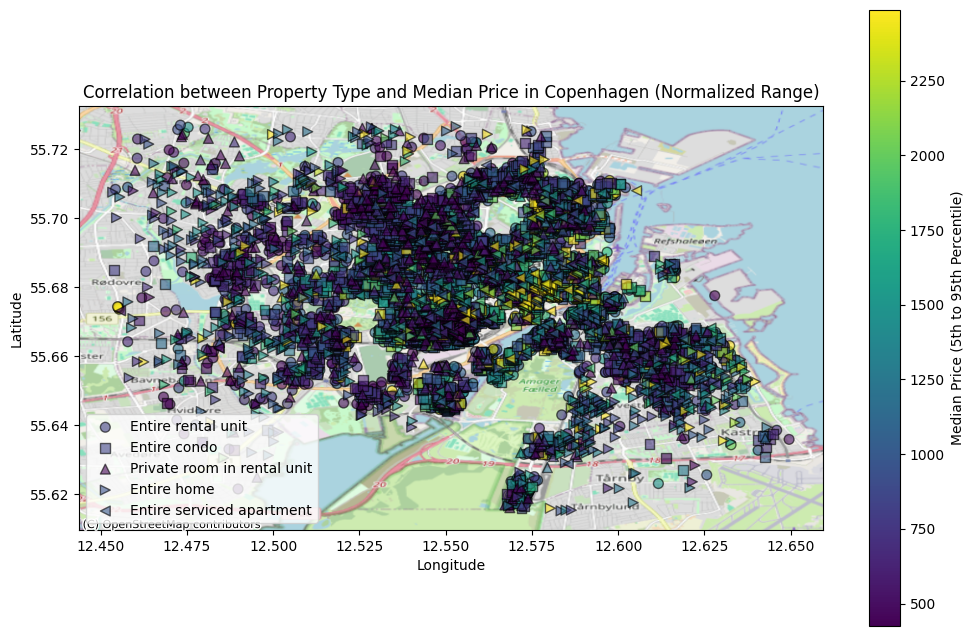

In [ ]:
import matplotlib.colors as mcolors

# Convert price to a numeric value
copenhagen_listings['price'] = copenhagen_listings['price'].replace('[\$,]', '', regex=True).astype(float)

# Select the top 5 most common property types
top_property_types = copenhagen_listings['property_type'].value_counts().head(5).index

# Filter for these property types
filtered_listings = copenhagen_listings[copenhagen_listings['property_type'].isin(top_property_types)]

# Group by property type and location, calculate the median price
median_price_property = filtered_listings.groupby(['property_type', 'latitude', 'longitude'])['price'].median().reset_index()

# Creating a GeoDataFrame for the median prices by property type
geometry_median_property = [Point(xy) for xy in zip(median_price_property['longitude'], median_price_property['latitude'])]
geo_median_price_property = gpd.GeoDataFrame(median_price_property, geometry=geometry_median_property, crs="EPSG:4326")

# Determine the range for the color scale
min_price_range = geo_median_price_property['price'].quantile(0.05)  # 5th percentile
max_price_range = geo_median_price_property['price'].quantile(0.95)  # 95th percentile

# Normalizing the median price within this range for the color scale
norm_median_range = mcolors.Normalize(vmin=min_price_range, vmax=max_price_range)
colormap_median = plt.cm.viridis

# Creating the plot with the defined color range
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
markers = ['o', 's', '^', '>', '<']  # Different markers for different property types

for property_type, marker in zip(top_property_types, markers):
    subset = geo_median_price_property[geo_median_price_property['property_type'] == property_type]
    ax.scatter(subset['longitude'], subset['latitude'], label=property_type,
               c=colormap_median(norm_median_range(subset['price'].values)),
               marker=marker, s=50, alpha=0.6, edgecolor='k')

# Adding a colorbar for the median price within the defined range
sm_median_range = plt.cm.ScalarMappable(cmap=colormap_median, norm=norm_median_range)
sm_median_range.set_array([])
fig.colorbar(sm_median_range, ax=ax, label='Median Price (5th to 95th Percentile)')

ctx.add_basemap(ax, crs=geo_median_prices.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

# Legend and title
plt.legend()
plt.title('Correlation between Property Type and Median Price in Copenhagen (Normalized Range)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


In [ ]:
import folium
from folium.plugins import MarkerCluster
from folium import Icon
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt

# Convert price to a numeric value
copenhagen_listings['price'] = copenhagen_listings['price'].replace('[\$,]', '', regex=True).astype(float)

# Select the top 5 most common property types
top_property_types = copenhagen_listings['property_type'].value_counts().head(5).index

# Filter for these property types
filtered_listings = copenhagen_listings[copenhagen_listings['property_type'].isin(top_property_types)]

# Group by property type and location, calculate the median price
median_price_property = filtered_listings.groupby(['property_type', 'latitude', 'longitude'])['price'].median().reset_index()

# Determine the range for the color scale
min_price_range = median_price_property['price'].quantile(0.05)  # 5th percentile
max_price_range = median_price_property['price'].quantile(0.95)  # 95th percentile

# Normalizing the median price within this range for the color scale
norm_median_range = mcolors.Normalize(vmin=min_price_range, vmax=max_price_range)
colormap_median = colormap_median = plt.cm.ScalarMappable(norm=norm_median_range, cmap='viridis')

# Create a Folium map centered around Copenhagen
map_copenhagen = folium.Map(location=[55.6761, 12.5683], zoom_start=12)

# Create a Marker Cluster
marker_cluster = MarkerCluster().add_to(map_copenhagen)

# Define a dictionary for property type to icon mapping
property_icons = {
    'Entire rental unit': 'home',  # Most common type
    'Entire condo': 'building',  # Second most common
    'Private room in rental unit': 'bed',  # Third most common
    'Entire home': 'house',  # Fourth most common
    'Entire serviced apartment': 'apartment'  # Fifth most common
}

# Initialize a dictionary to hold the MarkerCluster objects for each property type
clusters = {ptype: MarkerCluster() for ptype in property_icons.keys()}

# Adding markers to the respective MarkerCluster
for _, row in median_price_property.iterrows():
    icon_name = property_icons.get(row['property_type'], 'question-sign')
    marker = folium.Marker(location=[row['latitude'], row['longitude']],
                           popup=f"{row['property_type']}: ${row['price']}",
                           icon=Icon(icon=icon_name, prefix='fa'))
    clusters[row['property_type']].add_child(marker)

# Create a FeatureGroup for each property type and add the corresponding MarkerCluster to it
feature_groups = {}
for ptype, cluster in clusters.items():
    fg = folium.FeatureGroup(name=ptype)
    fg.add_child(cluster)
    feature_groups[ptype] = fg

# Add the FeatureGroups to the map
for fg in feature_groups.values():
    fg.add_to(map_copenhagen)

# Add LayerControl to the map
folium.LayerControl(collapsed=False).add_to(map_copenhagen)

# Display the map
map_copenhagen


In [29]:
# Function to format amenities
def format_amenities(amenities_list):
    if isinstance(amenities_list, list):
        # Join the list into a comma-separated string
        return ', '.join(amenities_list)
    else:
        return "No amenities listed"

# Apply the function to the 'amenities' column
copenhagen_listings['formatted_amenities'] = copenhagen_listings['amenities'].apply(format_amenities)

<ipython-input-29-0f00d5546acb>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copenhagen_listings['formatted_amenities'] = copenhagen_listings['amenities'].apply(format_amenities)


In [ ]:
import folium
from folium.plugins import MarkerCluster
from folium.plugins import HeatMap
from folium import Icon
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt

# Convert price to a numeric value
copenhagen_listings['price'] = copenhagen_listings['price'].replace('[\$,]', '', regex=True).astype(float)

# Select the top 5 most common property types
top_property_types = copenhagen_listings['property_type'].value_counts().head(5).index

# Filter for these property types
filtered_listings = copenhagen_listings[copenhagen_listings['property_type'].isin(top_property_types)]

# Group by property type and location, calculate the median price
median_price_property = filtered_listings.groupby(['property_type', 'latitude', 'longitude'])['price'].median().reset_index()

# Determine the range for the color scale
min_price_range = median_price_property['price'].quantile(0.05)  # 5th percentile
max_price_range = median_price_property['price'].quantile(0.95)  # 95th percentile

# Normalizing the median price within this range for the color scale
norm_median_range = mcolors.Normalize(vmin=min_price_range, vmax=max_price_range)
colormap_median = colormap_median = plt.cm.ScalarMappable(norm=norm_median_range, cmap='viridis')

# Prepare data for the heatmap (use latitude, longitude, and some weight - e.g., price)
heatmap_data = [[row['latitude'], row['longitude'], row['price']] for index, row in filtered_listings.iterrows()]

# Create a HeatMap layer and add it to the map
heatmap = HeatMap(heatmap_data)
map_copenhagen.add_child(heatmap)

# Create a Folium map centered around Copenhagen
map_copenhagen = folium.Map(location=[55.6761, 12.5683], zoom_start=12)

# Create a Marker Cluster
marker_cluster = MarkerCluster().add_to(map_copenhagen)

# Define a dictionary for property type to icon mapping
property_icons = {
    'Entire rental unit': 'home',  # Most common type
    'Entire condo': 'building',  # Second most common
    'Private room in rental unit': 'bed',  # Third most common
    'Entire home': 'house',  # Fourth most common
    'Entire serviced apartment': 'h-square'  # Fifth most common
}

# Initialize a dictionary to hold the MarkerCluster objects for each property type
clusters = {ptype: MarkerCluster() for ptype in property_icons.keys()}

# Adding markers to the respective MarkerCluster
for _, row in filtered_listings.iterrows():
    icon_name = property_icons.get(row['property_type'], 'question-sign')
    amenities_list = ', '.join(row['amenities'])
    description = row['description'] if 'description' in row else "No description available"

    popup_content = f"{row['property_type']}: ${row['price']}<br>Description: {description}<br><br>Amenities: {amenities_list}"
    popup = folium.Popup(popup_content, max_width=300)
    marker = folium.Marker(location=[row['latitude'], row['longitude']],
                           popup=popup,
                           icon=Icon(icon=icon_name, prefix='fa'))
    clusters[row['property_type']].add_child(marker)

# Create a FeatureGroup for each property type and add the corresponding MarkerCluster to it
feature_groups = {}
for ptype, cluster in clusters.items():
    fg = folium.FeatureGroup(name=ptype)
    fg.add_child(cluster)
    feature_groups[ptype] = fg

# Add the FeatureGroups to the map
for fg in feature_groups.values():
    fg.add_to(map_copenhagen)

# Add LayerControl to the map
folium.LayerControl(collapsed=False).add_to(map_copenhagen)

# Display the map
map_copenhagen


In [ ]:
import folium
from folium.plugins import MarkerCluster, HeatMap
from folium import Icon
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt

# Convert price to a numeric value
copenhagen_listings['price'] = copenhagen_listings['price'].replace('[\$,]', '', regex=True).astype(float)

# Select the top 5 most common property types
top_property_types = copenhagen_listings['property_type'].value_counts().head(5).index

# Filter for these property types
filtered_listings = copenhagen_listings[copenhagen_listings['property_type'].isin(top_property_types)]

# Group by property type and location, calculate the median price
median_price_property = filtered_listings.groupby(['property_type', 'latitude', 'longitude'])['price'].median().reset_index()

# Determine the range for the color scale
min_price_range = median_price_property['price'].quantile(0.05)  # 5th percentile
max_price_range = median_price_property['price'].quantile(0.95)  # 95th percentile

# Normalizing the median price within this range for the color scale
norm_median_range = mcolors.Normalize(vmin=min_price_range, vmax=max_price_range)
colormap_median = plt.cm.ScalarMappable(norm=norm_median_range, cmap='viridis')

# Create a Folium map centered around Copenhagen
map_copenhagen = folium.Map(location=[55.6761, 12.5683], zoom_start=12)

# Prepare data for the heatmap
heatmap_data = [[row['latitude'], row['longitude'], row['price']] for index, row in filtered_listings.iterrows()]

# Define a dictionary for property type to icon mapping
property_icons = {
    'Entire rental unit': 'home',
    'Entire condo': 'building',
    'Private room in rental unit': 'bed',
    'Entire home': 'house',
    'Entire serviced apartment': 'h-square'
}

# Initialize a dictionary to hold the MarkerCluster objects for each property type
clusters = {ptype: MarkerCluster() for ptype in property_icons.keys()}

# Adding markers to the respective MarkerCluster
for _, row in filtered_listings.iterrows():
    icon_name = property_icons.get(row['property_type'], 'question-sign')
    amenities_list = ', '.join(row['amenities'])
    description = row['description'] if 'description' in row else "No description available"

    popup_content = f"{row['property_type']}: ${row['price']}<br>Description: {description}<br><br>Amenities: {amenities_list}"

    popup = folium.Popup(popup_content, max_width=300)
    marker = folium.Marker(location=[row['latitude'], row['longitude']],
                           popup=popup,
                           icon=Icon(icon=icon_name, prefix='fa'))
    clusters[row['property_type']].add_child(marker)

# Create a FeatureGroup for each property type and add the corresponding MarkerCluster to it
feature_groups = {}
for ptype, cluster in clusters.items():
    fg = folium.FeatureGroup(name=ptype)
    fg.add_child(cluster)
    feature_groups[ptype] = fg

# Create a HeatMap layer and add it to a FeatureGroup
heatmap = HeatMap(heatmap_data)
heatmap_feature_group = folium.FeatureGroup(name='Price Heatmap')
heatmap_feature_group.add_child(heatmap)
map_copenhagen.add_child(heatmap_feature_group)

# Add the FeatureGroups to the map
for fg in feature_groups.values():
    fg.add_to(map_copenhagen)

# Add LayerControl to the map
folium.LayerControl(collapsed=False).add_to(map_copenhagen)

# Display the map
map_copenhagen


We think having an interactive map like this could be interesting so we are going to host it on github for later use.

In order to host the folium map online, we first need to save it as an .html and then post it to github.

In [39]:
map_copenhagen.save('map_copenhagen.html')

Again this map shows that the center is dominating the price, but that there are a couple of outliers. Let's create a map for each unit type to get a better look at how the listings and price is distributed.

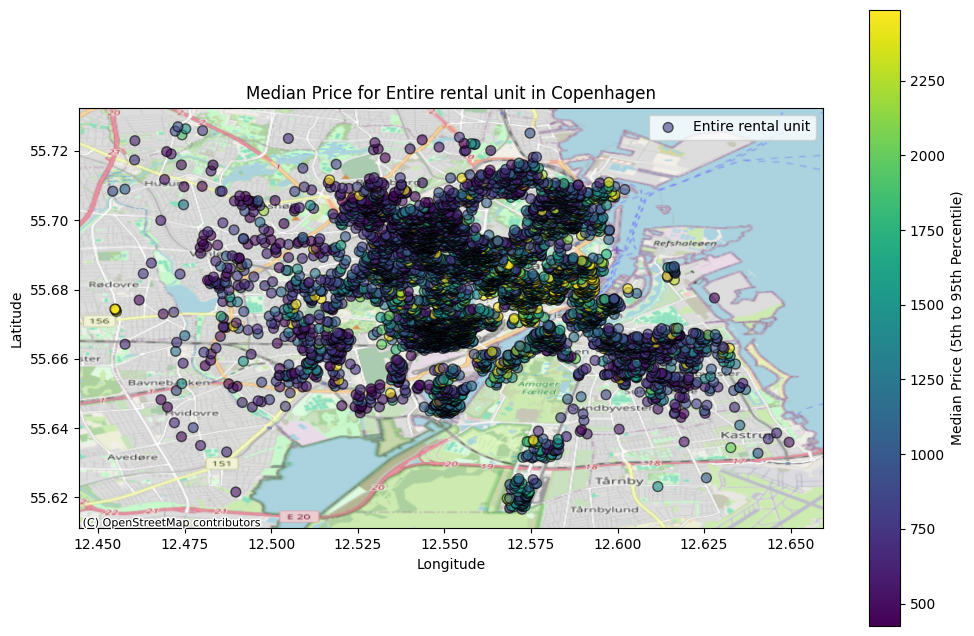

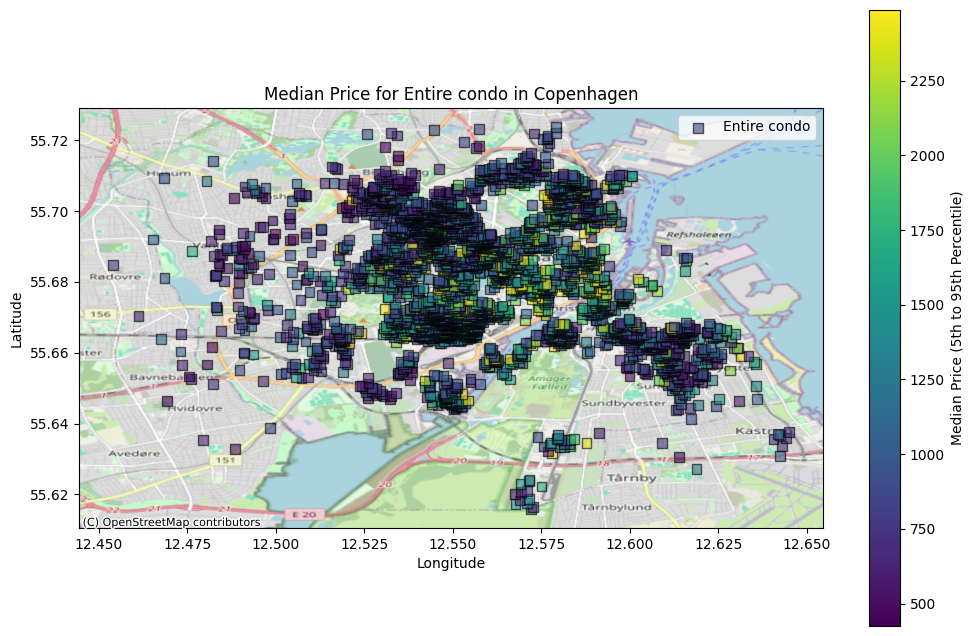

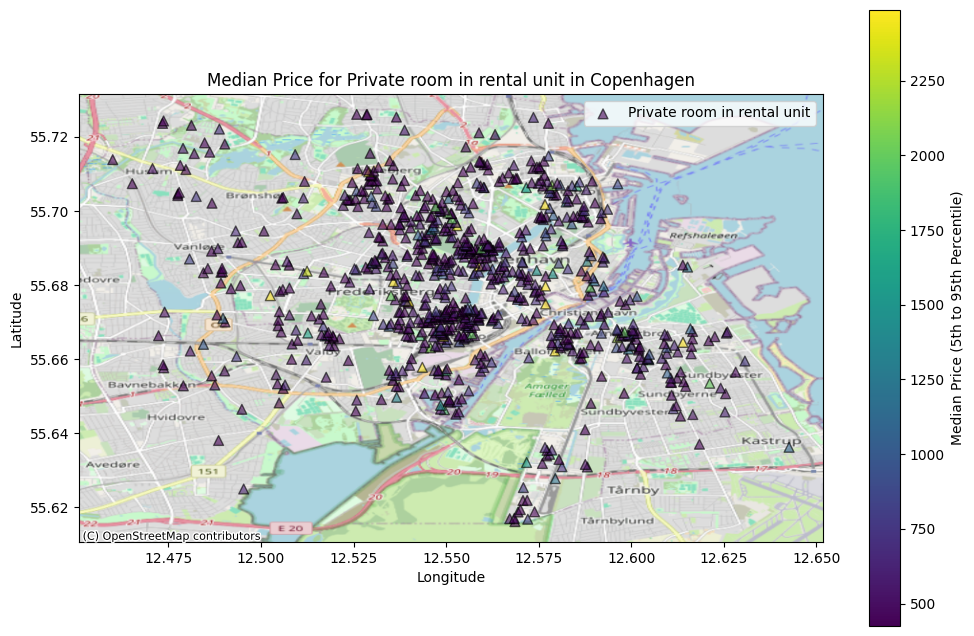

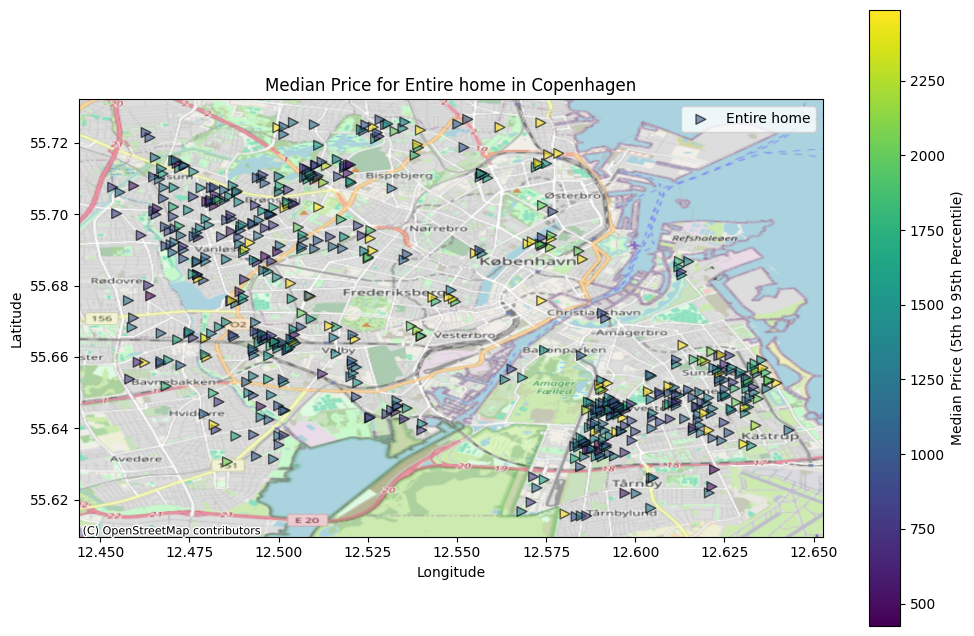

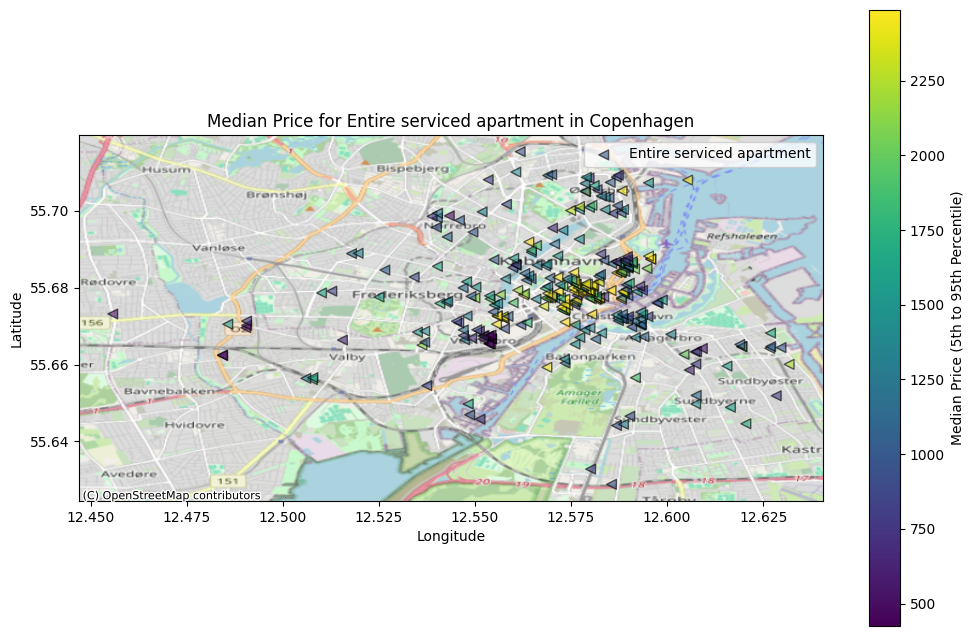

In [ ]:
# Reusing the markers array defined earlier
markers = ['o', 's', '^', '>', '<']  # Different markers for different property types

# Loop through each property type and create a map with the corresponding marker
for property_type, marker in zip(top_property_types, markers):
    # Filter for the specific property type
    specific_type_listings = geo_median_price_property[geo_median_price_property['property_type'] == property_type]

    # Creating the plot for each property type
    fig, ax = plt.subplots(1, 1, figsize=(12, 8))
    ax.scatter(specific_type_listings['longitude'], specific_type_listings['latitude'],
               c=colormap_median(norm_median_range(specific_type_listings['price'].values)),
               s=50, alpha=0.6, edgecolor='k', marker=marker, label=property_type)

    # Adding a colorbar for the median price within the defined range
    sm_median_range = plt.cm.ScalarMappable(cmap=colormap_median, norm=norm_median_range)
    sm_median_range.set_array([])
    fig.colorbar(sm_median_range, ax=ax, label='Median Price (5th to 95th Percentile)')

    ctx.add_basemap(ax, crs=geo_median_prices.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

    # Title and labels
    plt.title(f'Median Price for {property_type} in Copenhagen')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.legend()
    plt.show()



Let's also look at the median price in comparison to what room type the listing is.

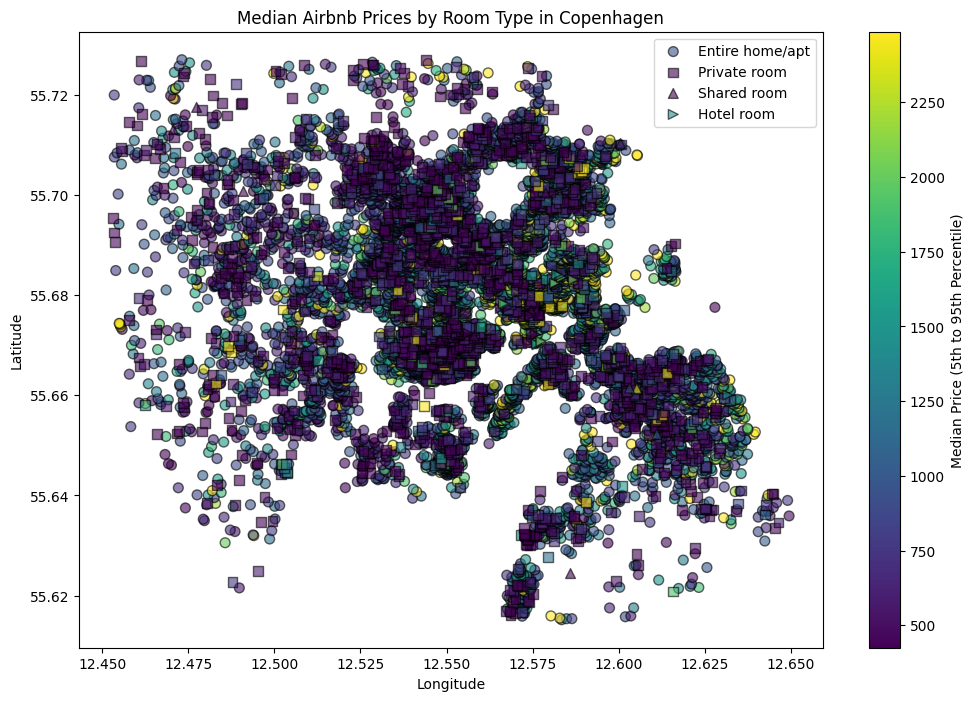

In [ ]:
# Room Type Analysis: Understanding price differences based on room types like entire home, private room, shared room

# Group by room type and location, then calculate the median price
median_price_by_room_type = copenhagen_listings.groupby(['room_type', 'latitude', 'longitude'])['price'].median().reset_index()

# Creating a GeoDataFrame for the median prices by room type
geometry_room_type = [Point(xy) for xy in zip(median_price_by_room_type['longitude'], median_price_by_room_type['latitude'])]
geo_median_price_room_type = gpd.GeoDataFrame(median_price_by_room_type, geometry=geometry_room_type, crs="EPSG:4326")

# Different markers for different room types
room_type_markers = {
    'Entire home/apt': 'o',
    'Private room': 's',
    'Shared room': '^',
    'Hotel room': '>'
}

# Creating the plot for room type analysis
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

for room_type, marker in room_type_markers.items():
    subset = geo_median_price_room_type[geo_median_price_room_type['room_type'] == room_type]
    ax.scatter(subset['longitude'], subset['latitude'], label=room_type,
               c=colormap_median(norm_median_range(subset['price'].values)),
               marker=marker, s=50, alpha=0.6, edgecolor='k')

# Adding a colorbar for the median price within the defined range
sm_median_range_room_type = plt.cm.ScalarMappable(cmap=colormap_median, norm=norm_median_range)
sm_median_range_room_type.set_array([])
fig.colorbar(sm_median_range_room_type, ax=ax, label='Median Price (5th to 95th Percentile)')

# Title and labels
plt.legend()
plt.title('Median Airbnb Prices by Room Type in Copenhagen')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

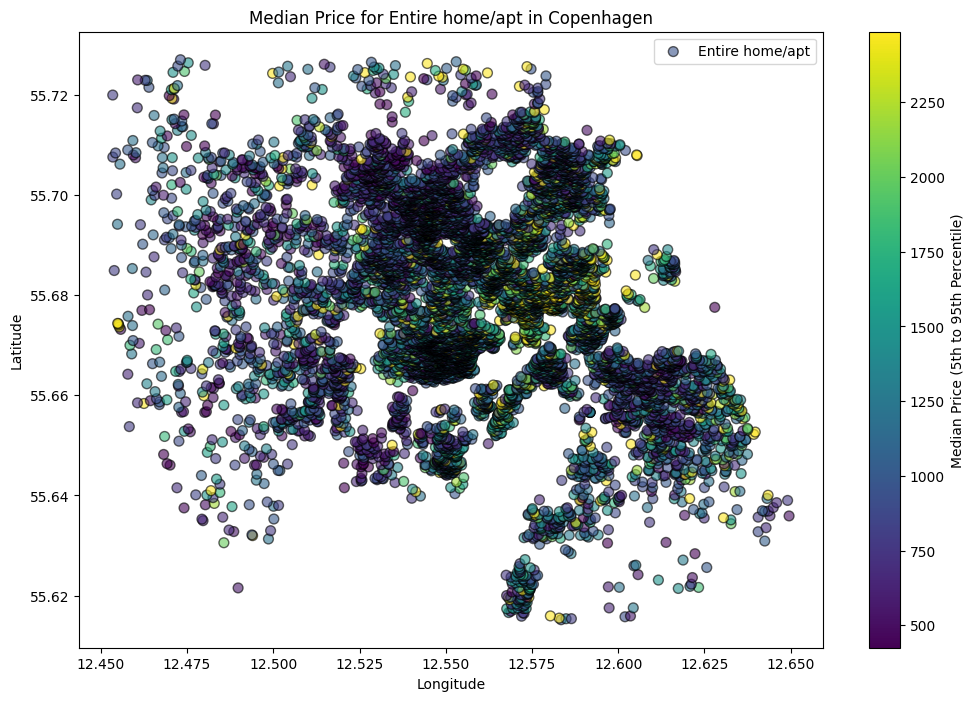

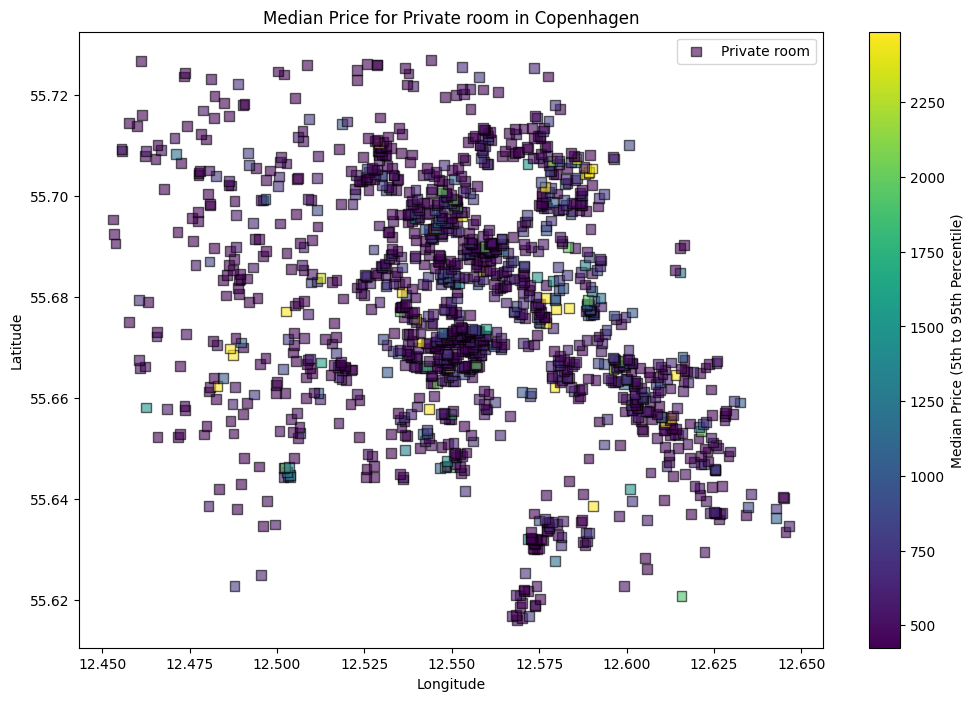

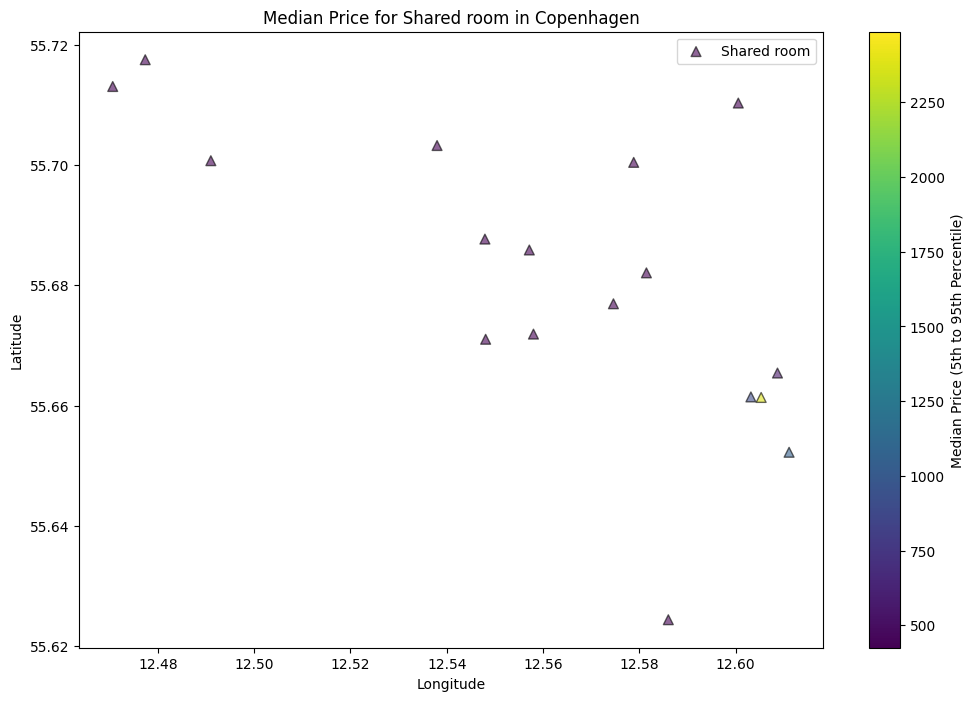

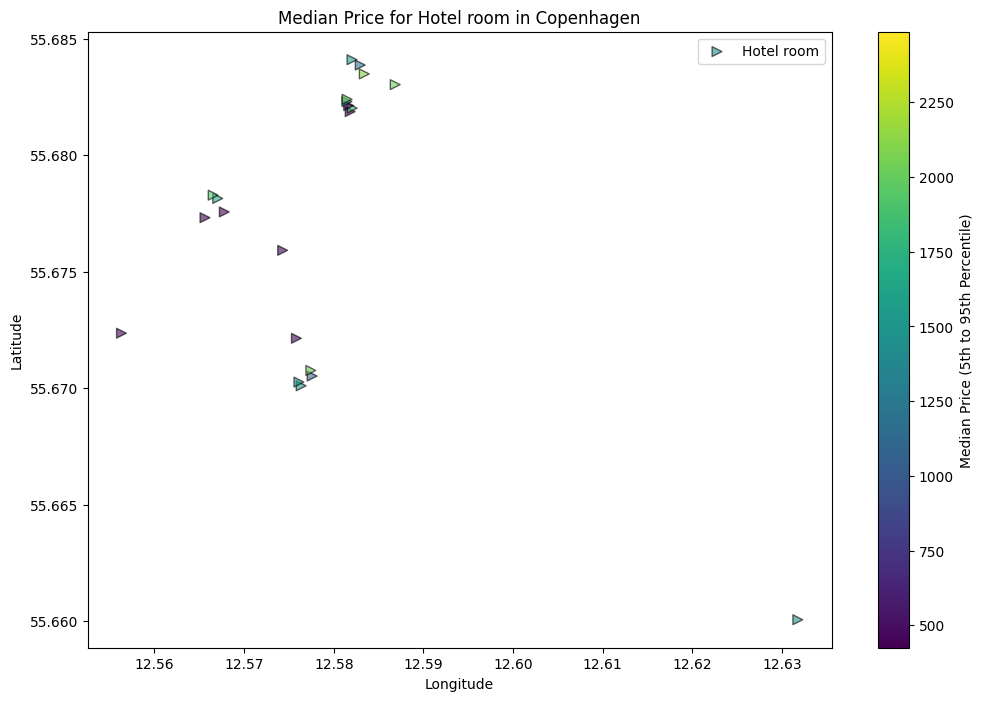

In [ ]:
# Creating separate maps for each room type using the corresponding marker shape

# Loop through each room type and create a map
for room_type, marker in room_type_markers.items():
    # Filter for the specific room type
    specific_room_type_listings = geo_median_price_room_type[geo_median_price_room_type['room_type'] == room_type]

    # Creating the plot for each room type
    fig, ax = plt.subplots(1, 1, figsize=(12, 8))
    ax.scatter(specific_room_type_listings['longitude'], specific_room_type_listings['latitude'],
               c=colormap_median(norm_median_range(specific_room_type_listings['price'].values)),
               s=50, alpha=0.6, edgecolor='k', marker=marker, label=room_type)

    # Adding a colorbar for the median price within the defined range
    sm_median_range_room_type = plt.cm.ScalarMappable(cmap=colormap_median, norm=norm_median_range)
    sm_median_range_room_type.set_array([])
    fig.colorbar(sm_median_range_room_type, ax=ax, label='Median Price (5th to 95th Percentile)')

    # Title and labels
    plt.title(f'Median Price for {room_type} in Copenhagen')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.legend()
    plt.show()

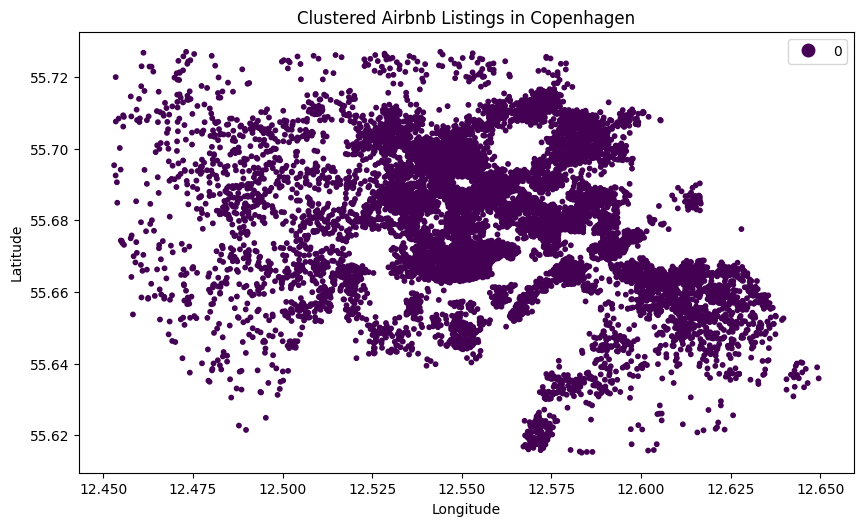

In [ ]:
import geopandas as gpd
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt

# Convert listings to a GeoDataFrame
gdf = gpd.GeoDataFrame(copenhagen_listings, geometry=gpd.points_from_xy(copenhagen_listings.longitude, copenhagen_listings.latitude))

# Clustering
coords = gdf[['latitude', 'longitude']].to_numpy()
db = DBSCAN(eps=0.01, min_samples=5).fit(coords)
gdf['cluster'] = db.labels_

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))
gdf.plot(column='cluster', categorical=True, legend=True, markersize=10, cmap='viridis', ax=ax)

# Optionally add a basemap
# ...

plt.title('Clustered Airbnb Listings in Copenhagen')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


## Looking at room types and review ratings

We also think looking at ratings and potentially room types, could give interresting insights.

As an example, it could be interesting to see if there is a coorelation between the different room types offered and how these rooms are precieved in the form of ratings left by customers.

In [16]:
# Extract the necessary columns for plotting
# We are interested in room_type and the review scores
review_columns = ['room_type', 'review_scores_accuracy', 'review_scores_checkin',
                  'review_scores_cleanliness', 'review_scores_communication',
                  'review_scores_location', 'review_scores_value']

# Filter the DataFrame with the necessary columns
reviews_df = airbnb_listings_df[review_columns]

# We need to group by 'room_type' and calculate the average review scores
review_scores_by_room_type = reviews_df.groupby('room_type').mean().reset_index()

# Check the resulting DataFrame
review_scores_by_room_type


,room_type,review_scores_accuracy,review_scores_checkin,review_scores_cleanliness,review_scores_communication,review_scores_location,review_scores_value
0,Entire home/apt,4.849984,4.890446,4.699875,4.912772,4.833573,4.724855
1,Hotel room,4.730000,4.825000,4.578182,4.795000,4.877727,4.541818
2,Private room,4.819260,4.880290,4.708101,4.873017,4.766227,4.699638
3,Shared room,4.356667,4.555333,4.448000,4.578000,4.564000,4.442000


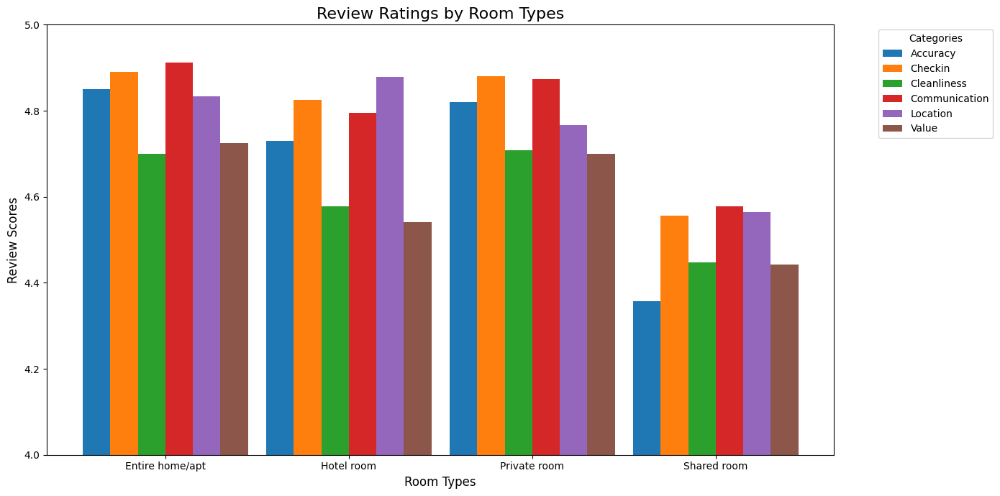

In [18]:
import numpy as np
import matplotlib.pyplot as plt

# Define the positions of the bars on the x-axis and the bar width
n_groups = len(review_scores_by_room_type)
bar_width = 0.15
index = np.arange(n_groups)

# Create the plot
fig, ax = plt.subplots(figsize=(14, 7))

# Add bars for each review category
for i, column in enumerate(review_columns[1:]):
    ax.bar(index + i*bar_width, review_scores_by_room_type[column], bar_width, label=column.split('_')[-1].capitalize())

# Set the labels and title
ax.set_xlabel('Room Types', fontsize=12)
ax.set_ylabel('Review Scores', fontsize=12)
ax.set_title('Review Ratings by Room Types', fontsize=16)
ax.set_xticks(index + bar_width * (len(review_columns[1:]) - 1) / 2)
ax.set_xticklabels(review_scores_by_room_type['room_type'], fontsize=10)
ax.set_ylim(4, 5) # We see average ratings ranging from 4 - 5

# Add a legend
ax.legend(title='Categories', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.tight_layout()
plt.show()


## Time and user growth

Since the database does not contain precise dates on each listing we find it would be difficult to accurately assume that host's were created the same time a listing was. Therefore a seasonality analysis it sort of out of reach.

However, in the dataframe we do find host_since and last_review, which we can use create a timeline on when hosts were created and potentially see if these hosts with listings are active.

In [19]:
from datetime import datetime

# Convert 'host_since' and 'last_review' columns to datetime format
df = airbnb_listings_df

df['host_since'] = pd.to_datetime(df['host_since'], errors='coerce')
df['last_review'] = pd.to_datetime(df['last_review'], errors='coerce')

# Calculate the days since the host was created and the last review
today = datetime.today()
df['days_since_host_created'] = (today - df['host_since']).dt.days
df['days_since_last_review'] = (today - df['last_review']).dt.days

# Displaying the first few rows with the calculated columns for verification
df[['host_since', 'days_since_host_created', 'last_review', 'days_since_last_review']].head()


,host_since,days_since_host_created,last_review,days_since_last_review
0,2009-05-12,5348,2022-06-16,565.0
1,2010-04-17,5008,2022-05-15,597.0
2,2010-04-22,5003,2020-03-02,1401.0
3,2010-05-15,4980,2019-08-02,1614.0
4,2012-01-04,4381,2018-09-18,1932.0


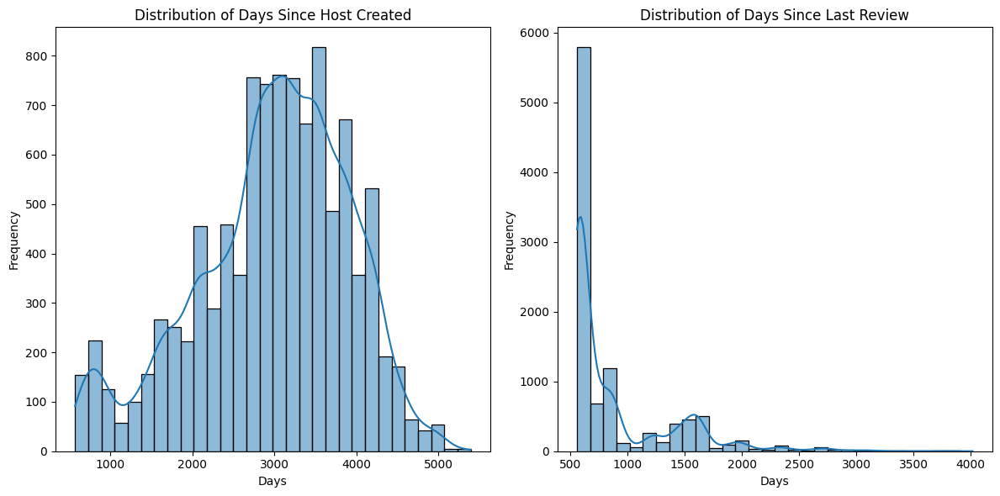

(count    10190.000000
 mean      2980.140726
 std        931.230521
 min        572.000000
 25%       2411.000000
 50%       3094.000000
 75%       3634.000000
 max       5392.000000
 Name: days_since_host_created, dtype: float64,
 count    10190.000000
 mean       883.913837
 std        488.697397
 min        557.000000
 25%        574.000000
 50%        624.000000
 75%        901.000000
 max       4016.000000
 Name: days_since_last_review, dtype: float64)

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns

# Removing NaN values for visualization purposes
df_cleaned = df.dropna(subset=['days_since_host_created', 'days_since_last_review'])

# Visualizing the distribution of 'days_since_host_created' and 'days_since_last_review'
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.histplot(df_cleaned['days_since_host_created'], bins=30, kde=True)
plt.title('Distribution of Days Since Host Created')
plt.xlabel('Days')
plt.ylabel('Frequency')

plt.subplot(1, 2, 2)
sns.histplot(df_cleaned['days_since_last_review'], bins=30, kde=True)
plt.title('Distribution of Days Since Last Review')
plt.xlabel('Days')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Calculating basic statistics for these columns
stats_host_created = df_cleaned['days_since_host_created'].describe()
stats_last_review = df_cleaned['days_since_last_review'].describe()

stats_host_created, stats_last_review

This graph shows us two important things. Firstly it shows us that the userbase of Hosts has been growing over the past many years, with some years having significant growth.

Secondly the second graph shows us that the hosts and their listings are realativly active since most of the latest reviews were from the year that this data was scraped.

We'll continue our exploration by creating a timeseries to see how the userbase of hosts has grown over the years.

In [21]:
# Convert 'last_scraped' to datetime format and extract the year
df = airbnb_listings_df

df['year'] = pd.to_datetime(df['host_since']).dt.year

# Calculate the number of new hosts each year
new_hosts_per_year = df.groupby('year')['id'].nunique().reset_index(name='New Hosts per Year')

# Calculate the running count of hosts by year
new_hosts_per_year['Running Count Hosts'] = new_hosts_per_year['New Hosts per Year'].cumsum()

new_hosts_per_year


,year,New Hosts per Year,Running Count Hosts
0,2009,9,9
1,2010,107,116
2,2011,296,412
3,2012,956,1368
4,2013,1454,2822
5,2014,1912,4734
6,2015,2003,6737
7,2016,1864,8601
8,2017,1103,9704
9,2018,963,10667


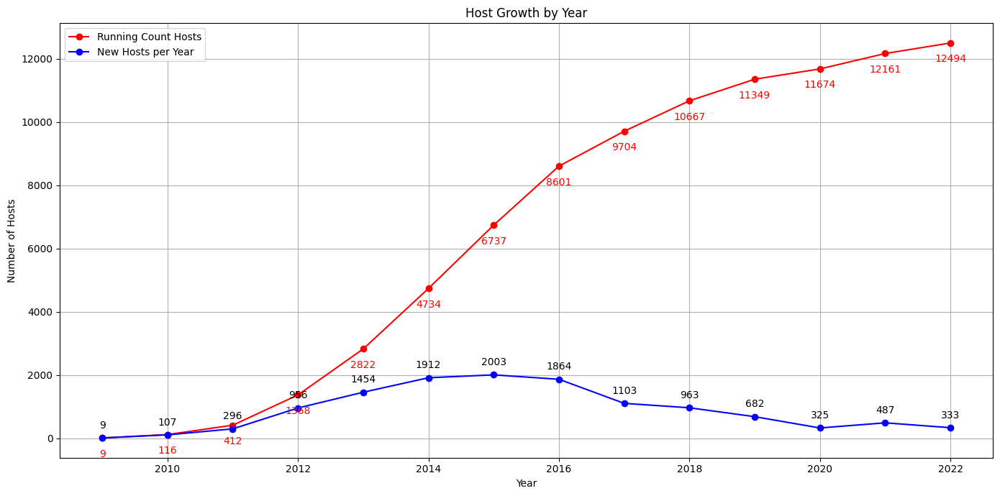

In [24]:
# Plotting the graph
plt.figure(figsize=(14, 7))

# Line plot for running count of hosts
plt.plot(new_hosts_per_year['year'], new_hosts_per_year['Running Count Hosts'], marker='o', color='red', label='Running Count Hosts')

# Line plot for new hosts per year
plt.plot(new_hosts_per_year['year'], new_hosts_per_year['New Hosts per Year'], marker='o', color='blue', label='New Hosts per Year')

# Adding data labels on the plot
for i, txt in enumerate(new_hosts_per_year['New Hosts per Year']):
    plt.annotate(txt, (new_hosts_per_year['year'][i], new_hosts_per_year['New Hosts per Year'][i] + 300), ha='center')

for i, txt in enumerate(new_hosts_per_year['Running Count Hosts']):
    plt.annotate(txt, (new_hosts_per_year['year'][i], new_hosts_per_year['Running Count Hosts'][i] - 600), ha='center', color='red')

# Adding titles and labels
plt.title('Host Growth by Year')
plt.xlabel('Year')
plt.ylabel('Number of Hosts')
plt.legend()
plt.grid(True)
plt.tight_layout()

# show the plot
plt.show()


## Ameneties Analysis
Let's continue and do an Amenities Analysis and determine if certain amenities influence the price of the listings.

We first need to xxtract the Amenities: The amenities are likely listed in a single column, possibly as a list or a string. We need to extract individual amenities and transform them into a format suitable for analysis.

In [ ]:
# Examining the format of the amenities column in the dataset
if 'amenities' in copenhagen_listings.columns:
    # Displaying the first few entries in the amenities column
    sample_amenities = copenhagen_listings['amenities'].head()
else:
    sample_amenities = "Amenities column not found in the dataset."

sample_amenities


0    ["Stove", "Free washer \u2013 In unit", "Coffe...
1    ["Private fenced garden or backyard", "Stove",...
2    ["Essentials", "Cooking basics", "TV", "Stove"...
3    ["Stove", "Children\u2019s books and toys", "W...
4    ["Essentials", "Cooking basics", "TV", "Hot wa...
Name: amenities, dtype: object

The amenities column in the dataset lists amenities as a string of comma-separated values. To analyze the impact of specific amenities on pricing, we need to:

Parse the Amenities: Extract each amenity from the string and transform it into a format that can be analyzed (e.g., creating separate columns for each amenity).

Create Indicator Variables: For each listing, create indicator variables (0 or 1) indicating the presence or absence of each amenity.

Analyze Pricing: Compare the median prices of listings with and without certain amenities.

In [ ]:
from collections import Counter
import ast

# Parsing the amenities column - converting string representation of list to actual list
# and then counting the frequency of each amenity
amenities_counter = Counter()
copenhagen_listings['amenities'].apply(lambda x: amenities_counter.update(ast.literal_eval(x)))

# Identifying the most common amenities
common_amenities = [amenity for amenity, count in amenities_counter.most_common(10)]
common_amenities

['Kitchen',
 'Wifi',
 'Essentials',
 'Heating',
 'Smoke alarm',
 'Long term stays allowed',
 'Hot water',
 'Dishes and silverware',
 'Cooking basics',
 'Iron']

The most common amenities in the Copenhagen Airbnb listings are:

- Kitchen
- Wifi
- Essentials
- Heating
- Smoke alarm
- Long term stays allowed
- Hot water
- Dishes and silverware
- Cooking basics
- Iron

Next, we'll create indicator variables for these common amenities. Each listing will have a 1 if it has the amenity and 0 if it does not. After setting up these indicators, we'll analyze how the presence of these amenities influences the pricing of listings.

In [ ]:
# Creating indicator variables for the most common amenities

# Function to create indicator variables for each amenity
def create_amenity_indicator(listing_amenities, amenity):
    amenities_list = ast.literal_eval(listing_amenities)
    return 1 if amenity in amenities_list else 0

# Adding indicator columns to the dataframe
for amenity in common_amenities:
    copenhagen_listings[amenity] = copenhagen_listings['amenities'].apply(lambda x: create_amenity_indicator(x, amenity))

# Checking the first few rows of the dataframe to confirm the addition of indicator variables
copenhagen_listings[common_amenities].head()

<ipython-input-220-af53d7bb84a4>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copenhagen_listings[amenity] = copenhagen_listings['amenities'].apply(lambda x: create_amenity_indicator(x, amenity))
<ipython-input-220-af53d7bb84a4>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copenhagen_listings[amenity] = copenhagen_listings['amenities'].apply(lambda x: create_amenity_indicator(x, amenity))
<ipython-input-220-af53d7bb84a4>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice

,Kitchen,Wifi,Essentials,Heating,Smoke alarm,Long term stays allowed,Hot water,Dishes and silverware,Cooking basics,Iron
0,1,1,1,1,1,0,1,1,1,1
1,0,1,1,1,0,1,1,1,1,1
2,1,1,1,1,0,1,0,1,1,1
3,1,1,1,1,0,0,1,1,1,1
4,1,1,1,1,0,0,1,1,1,0


The indicator variables for the top ten common amenities have been successfully added to the dataset. Each row now includes binary indicators (1 or 0) for the presence of amenities like Kitchen, Wifi, Essentials, Heating, and others.

Next, we'll analyze the influence of these amenities on the pricing of Airbnb listings. The approach will involve comparing the median prices of listings with and without each amenity. This will help us understand if and how much these amenities impact the pricing.

In [ ]:
# Analyzing the influence of amenities on pricing

# DataFrame to store median price for listings with and without each amenity
amenities_price_impact = pd.DataFrame(columns=['Amenity', 'Median Price (With)', 'Median Price (Without)'])

for amenity in common_amenities:
    # Median price for listings with the amenity
    median_price_with = copenhagen_listings[copenhagen_listings[amenity] == 1]['price'].median()

    # Median price for listings without the amenity
    median_price_without = copenhagen_listings[copenhagen_listings[amenity] == 0]['price'].median()

    # Appending results to the DataFrame
    amenities_price_impact = amenities_price_impact.append({
        'Amenity': amenity,
        'Median Price (With)': median_price_with,
        'Median Price (Without)': median_price_without
    }, ignore_index=True)

amenities_price_impact

<ipython-input-241-68a5d16f1c6c>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  amenities_price_impact = amenities_price_impact.append({
<ipython-input-241-68a5d16f1c6c>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  amenities_price_impact = amenities_price_impact.append({
<ipython-input-241-68a5d16f1c6c>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  amenities_price_impact = amenities_price_impact.append({
<ipython-input-241-68a5d16f1c6c>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  amenities_price_impact = amenities_price_impact.append({
<ipython-input-241-68a5d16f1c6c>:14: FutureWarning: The frame.append method is depre

,Amenity,Median Price (With),Median Price (Without)
0,Kitchen,979.0,649.0
1,Wifi,966.0,953.0
2,Essentials,950.0,1000.0
3,Heating,950.0,990.0
4,Smoke alarm,990.0,916.0
5,Long term stays allowed,986.0,950.0
6,Hot water,957.0,980.0
7,Dishes and silverware,990.0,944.0
8,Cooking basics,999.0,900.0
9,Iron,1000.0,900.0


Key Observations:

- Kitchen: A significant difference in median price is observed for listings with a kitchen compared to those without.
- Iron, Cooking Basics, Dishes and Silverware, Smoke Alarm: Listings with these amenities tend to have higher median prices.
- Wifi, Heating, Hot Water: The price difference is less pronounced for these amenities, indicating they might be standard expectations in most listings.
- Essentials: Interestingly, listings without 'Essentials' have a slightly higher median price than those with it.

This analysis suggests that certain amenities, like a kitchen, iron, and cooking-related amenities, can influence the pricing of Airbnb listings. Amenities that are more common and considered essential (like Wifi and Heating) show less impact on pricing, possibly because they are expected in most listings.

## Host Characteristics


In [ ]:
# Host Characteristics Analysis: Number of listings per host and host response rates

# Calculating the number of listings per host
listings_per_host = copenhagen_listings['host_id'].value_counts()

# Summary statistics for the number of listings per host
listings_per_host_stats = listings_per_host.describe()

# Host response rate - convert to numeric and analyze
copenhagen_listings['host_response_rate'] = copenhagen_listings['host_response_rate'].str.rstrip('%').astype('float') / 100
host_response_rate_stats = copenhagen_listings['host_response_rate'].describe()

listings_per_host_stats, host_response_rate_stats

<ipython-input-222-5577dfbd933f>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  copenhagen_listings['host_response_rate'] = copenhagen_listings['host_response_rate'].str.rstrip('%').astype('float') / 100


(count    10910.000000
 mean         1.120623
 std          2.103981
 min          1.000000
 25%          1.000000
 50%          1.000000
 75%          1.000000
 max        181.000000
 Name: host_id, dtype: float64,
 count    9421.000000
 mean        0.916386
 std         0.197924
 min         0.000000
 25%         0.970000
 50%         1.000000
 75%         1.000000
 max         1.000000
 Name: host_response_rate, dtype: float64)

### Number of Listings per Host
- Count: 10,911 hosts in the dataset.
- Mean: On average, each host has about 1.12 listings.
- Std (Standard Deviation): A standard deviation of 2.1 indicates some variation in the number of listings per host.
- Min: The minimum number of listings per host is 1.
- Max: The maximum number of listings by a single host is 181, suggesting the presence of professional hosts with multiple properties.

### Host Response Rate
- Mean: The average response rate is about 91.64%.
- Std (Standard Deviation): A standard deviation of 19.79% indicates variability in host responsiveness.
- Min: The minimum response rate is 0% (no response).
- Max: The maximum response rate is 100% (always response).

## Seasonal Availablity

To continue our analysis we could try to look see at what seasons, there are a higher concentration of available listings.


In [ ]:
df =airbnb_listings_df
# Identify columns related to dates
date_columns = [col for col in df.columns if 'date' in col.lower() or 'time' in col.lower()]
print(date_columns)

['host_response_time', 'accommodates']


In [ ]:
df['availability_30']

0         0
1         0
2         3
3         3
4         0
         ..
12490     7
12491     6
12492     6
12493    22
12494     0
Name: availability_30, Length: 12494, dtype: int64

In [ ]:
# Convert 'calendar_last_scraped' to datetime
df['calendar_last_scraped'] = pd.to_datetime(df['calendar_last_scraped'])

# Calculate the month of the year from 'calendar_last_scraped'
df['scraped_month'] = df['calendar_last_scraped'].dt.month

# Group by month and calculate average availability
avg_availability_by_month = df.groupby('scraped_month').agg({
    'availability_30': 'mean',
    'availability_60': 'mean',
    'availability_90': 'mean',
    'availability_365': 'mean'
}).reset_index()

print(avg_availability_by_month)

# Plotting the average availability trends
plt.plot(avg_availability_by_month['scraped_month'], avg_availability_by_month['availability_30'], label='30 days')
plt.plot(avg_availability_by_month['scraped_month'], avg_availability_by_month['availability_60'], label='60 days')
plt.plot(avg_availability_by_month['scraped_month'], avg_availability_by_month['availability_90'], label='90 days')
plt.plot(avg_availability_by_month['scraped_month'], avg_availability_by_month['availability_365'], label='365 days')

plt.title('Average Availability of Airbnb Listings by Month in Copenhagen')
plt.xlabel('Month')
plt.ylabel('Average Availability')
plt.legend()
plt.show()


KeyError: ignored

## Identifying attributes common to the top 10% most expensive listings

In [ ]:
# First, determine the price threshold for the top 10%
top_10_percent_price = copenhagen_listings['price'].quantile(0.90)

# Filter the dataset for the top 10% most expensive listings
top_10_percent_listings = copenhagen_listings[copenhagen_listings['price'] >= top_10_percent_price]

# Analyze common attributes
# We can look at factors like property type, room type, amenities, host response rate, and number of reviews
common_attributes = {
    'Property Type': top_10_percent_listings['property_type'].mode()[0],
    'Room Type': top_10_percent_listings['room_type'].mode()[0],
    'Top Amenities': [amenity for amenity, count in Counter(
        ",".join(top_10_percent_listings['amenities']).replace('"', '').split(",")).most_common(5)],
    'Average Host Response Rate': top_10_percent_listings['host_response_rate'].mean(),
    'Average Number of Reviews': top_10_percent_listings['number_of_reviews'].mean(),
    'Average Review Scores Rating': top_10_percent_listings['review_scores_rating'].mean(),
    'Average Accommodates': top_10_percent_listings['accommodates'].mean(),
    'Average Bedrooms': top_10_percent_listings['bedrooms'].mean(),
    #'Average Bathrooms': top_10_percent_listings['bathrooms'].mean(),
    'Average Minimum Nights': top_10_percent_listings['minimum_nights'].mean(),
    'Average Maximum Nights': top_10_percent_listings['maximum_nights'].mean()
}

common_attributes


TypeError: ignored

Interesting from this, we see the following traits as the most common ones in the top 10% most expensive listings:
- Property Type: 'Entire rental unit',
- Room Type: 'Entire home/apt',
- Top Amenities: [' Kitchen',
  ' Wifi',
  ' Long term stays allowed',
  ' Heating',
  ' Hair dryer'],
- Average Host Response Rate: 0.8971126082771895,
- Average Number of Reviews: 19.462857142857143,
- Average Review Scores Rating: 4.760705128205129,
- Average Accommodates: 5.240816326530612,
- Average Bedrooms: 2.512295081967213,
- Average Bathrooms: nan,
- Average Minimum Nights: 4.000816326530612,
- Average Maximum Nights: 555.5085714285714


In [ ]:
# Identifying unique listings based on certain features
unique_top_listings = top_10_percent_listings.drop_duplicates(subset=['property_type', 'room_type', 'amenities'])

# Showcasing the top unique listings
showcase_columns = ['listing_url', 'property_type', 'room_type', 'amenities', 'price']
top_unique_listings_showcase = unique_top_listings[showcase_columns].head(10)

print(top_unique_listings_showcase)

# Create a GeoDataFrame
geometry = [Point(xy) for xy in zip(unique_top_listings['longitude'], unique_top_listings['latitude'])]
gdf = gpd.GeoDataFrame(unique_top_listings, geometry=geometry, crs="EPSG:4326")

# Plotting the listings
fig, ax = plt.subplots(figsize=(10, 10))
gdf.plot(ax=ax, markersize=10, color='red', alpha=0.6)

# Optionally add a basemap
gdf.to_crs(epsg=3857, inplace=True)
ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite)

# Adjusting the map settings
ax.set_axis_off()
plt.title('Top 10% Most Expensive and Unique Airbnb Listings in Copenhagen')
plt.show()

TypeError: ignored